In [2]:
import sys
import os
from os.path import join
import cv2
import torch
import numpy as np
import pandas as pd
import pickle as pkl
from PIL import Image
from tqdm.auto import tqdm, trange
import seaborn as sns
import matplotlib.pyplot as plt
sys.path.append("/n/home13/xupan/sompolinsky_lab/DiffusionObjectRelation/utils")
from cv2_eval_utils import find_classify_object_masks

positive_threshold = 180 

## Collect all classifier and their associate statistics

In [3]:
#saveroot = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot/latent_store"
#figdir = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot/Figure_latent_feature_heatmap'
figdir = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot/feature_classifier'
syndir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot/synopsis"
os.makedirs(syndir, exist_ok=True)

In [ ]:
syn_col = []
feature_names = [
    "leftobj_vs_rightobj",
    "rightobj_vs_leftobj",
    "obj_vs_others",
    "triangle_vs_others", 
    "circle_vs_others",
    "square_vs_others", 
    "blue_obj_vs_others",
    "red_obj_vs_others",
    "red_circle_vs_others",
    "red_square_vs_others",
    "red_triangle_vs_others", 
    "blue_circle_vs_others", 
    "blue_square_vs_others",
    "blue_triangle_vs_others",
    "topobj_vs_others", 
    "bottomobj_vs_others",
    "topobj_vs_bottomobj"
]
# annot_label = "triangle_vs_others"
for annot_label in feature_names:
    for t_index in reversed(range(14)):
        for training_pass in [("cond",), ("uncond",), ("cond", "uncond")]:
            training_pass_str = "-".join(training_pass)+"Pass"
            if not os.path.exists(join(figdir, f"red_blue_8_relation_diff_t{t_index}_{annot_label}_classifier_{training_pass_str}.pkl")):
                print(f"No classifier found for {annot_label} at t_index {t_index} and training pass {training_pass_str}")
                continue
            data = pkl.load(open(join(figdir, f"red_blue_8_relation_diff_t{t_index}_{annot_label}_classifier_{training_pass_str}.pkl"), 'rb'))
            clf, boundary_vector, eval_dict = data["classifier"], data["boundary_vector"], data["eval_dict"]
            stats_dict = eval_dict.copy()
            stats_dict["t_index"] = t_index
            stats_dict["training_pass"] = training_pass_str
            stats_dict["annot_label"] = annot_label
            stats_dict["boundary_vector"] = boundary_vector
            # stats_dict.pop('classifier')
            # stats_dict.pop('boundary_vector')
            syn_col.append(stats_dict)
            # print(f"t_index: {t_index}, training_pass: {training_pass_str}, eval_dict: {eval_dict}")
            # print(f"boundary_vector: {boundary_vector}")
syn_df = pd.DataFrame(syn_col)
# syn_df.to_csv(join(figdir, f"red_blue_8_relation_diff_stats_synopsis.csv"), index=False)
syn_df.to_pickle(join(syndir, f"red_blue_left_right_relation_feature_classifier_stats_synopsis.pkl"))

No classifier found for leftobj_vs_rightobj at t_index 13 and training pass condPass
No classifier found for leftobj_vs_rightobj at t_index 13 and training pass uncondPass
No classifier found for leftobj_vs_rightobj at t_index 13 and training pass cond-uncondPass
No classifier found for leftobj_vs_rightobj at t_index 12 and training pass condPass
No classifier found for leftobj_vs_rightobj at t_index 12 and training pass uncondPass
No classifier found for leftobj_vs_rightobj at t_index 12 and training pass cond-uncondPass
No classifier found for leftobj_vs_rightobj at t_index 11 and training pass condPass
No classifier found for leftobj_vs_rightobj at t_index 11 and training pass uncondPass
No classifier found for leftobj_vs_rightobj at t_index 11 and training pass cond-uncondPass
No classifier found for leftobj_vs_rightobj at t_index 10 and training pass condPass
No classifier found for leftobj_vs_rightobj at t_index 10 and training pass uncondPass
No classifier found for leftobj_vs_r

PermissionError: [Errno 13] Permission denied: '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot/synopsis/red_blue_8_relation_feature_classifier_stats_synopsis.pkl'

In [7]:
print(syn_df.columns)
print(syn_df.shape)
syn_df.head()

Index(['classifier', 'train_score', 'test_score', 'confusion_matrix',
       'precision', 'recall', 'f1_score', 't_index', 'training_pass',
       'annot_label', 'boundary_vector'],
      dtype='object')
(630, 11)


,classifier,train_score,test_score,confusion_matrix,precision,recall,f1_score,t_index,training_pass,annot_label,boundary_vector
0,"LogisticRegression(fit_intercept=False, random...",0.995772,0.994317,"[[45470, 147], [142, 5096]]",0.972890,0.971963,0.972426,13,condPass,obj_vs_others,"[0.0020000626814929983, -0.015150953061477972,..."
1,"LogisticRegression(fit_intercept=False, random...",0.995428,0.994298,"[[45465, 152], [138, 5100]]",0.973654,0.971059,0.972355,13,uncondPass,obj_vs_others,"[0.0029129305300324387, -0.011853690567018413,..."
2,"LogisticRegression(fit_intercept=False, random...",0.995463,0.994838,"[[90703, 294], [231, 10481]]",0.978435,0.972715,0.975567,13,cond-uncondPass,obj_vs_others,"[0.0071341461251355, -0.014230321309282128, -0..."
3,"LogisticRegression(fit_intercept=False, random...",0.994469,0.993039,"[[45434, 183], [171, 5067]]",0.967354,0.965143,0.966247,12,condPass,obj_vs_others,"[0.005477988844012569, -0.010122156548400044, ..."
4,"LogisticRegression(fit_intercept=False, random...",0.993998,0.992960,"[[45443, 174], [184, 5054]]",0.964872,0.966718,0.965794,12,uncondPass,obj_vs_others,"[0.013719337402795299, -0.011873813713585793, ..."


In [114]:
# recompute the precision, recall, f1_score
syn_df["precision"] = syn_df["confusion_matrix"].apply(lambda cm: cm[1,1] / (cm[1,1] + cm[0,1]))
syn_df["recall"] = syn_df["confusion_matrix"].apply(lambda cm: cm[1,1] / (cm[1,1] + cm[1,0]))
syn_df["f1_score"] = syn_df["confusion_matrix"].apply(lambda cm: 2 * cm[1,1] / (2 * cm[1,1] + cm[1,0] + cm[0,1]))

/tmp/ipykernel_1980073/3791919989.py:2: RuntimeWarning: invalid value encountered in scalar divide
  syn_df["precision"] = syn_df["confusion_matrix"].apply(lambda cm: cm[1,1] / (cm[1,1] + cm[0,1]))


In [113]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
y_true = [0, 1, 0, 0, 1, 1]
y_pred = [1, 1, 1, 1, 0, 1]
cm = confusion_matrix(y_true, y_pred)
print(cm)
# format 
# 0: negative, 1: positive
# [TN, FP] 
# [FN, TP]
# precision = TP / (TP + FP)
# recall = TP / (TP + FN)
# f1_score = 2 * TP / (2 * TP + FP + FN)
assert precision_score(y_true, y_pred) == cm[1,1] / (cm[1,1] + cm[0,1]) 
assert recall_score(y_true, y_pred) == cm[1,1] / (cm[1,1] + cm[1,0])
assert f1_score(y_true, y_pred) == 2 * cm[1,1] / (2 * cm[1,1] + cm[1,0] + cm[0,1])
# print(precision_score(y_true, y_pred))
# print(recall_score(y_true, y_pred))
# print(f1_score(y_true, y_pred))

[[0 3]
 [1 2]]


### Classification accuracy

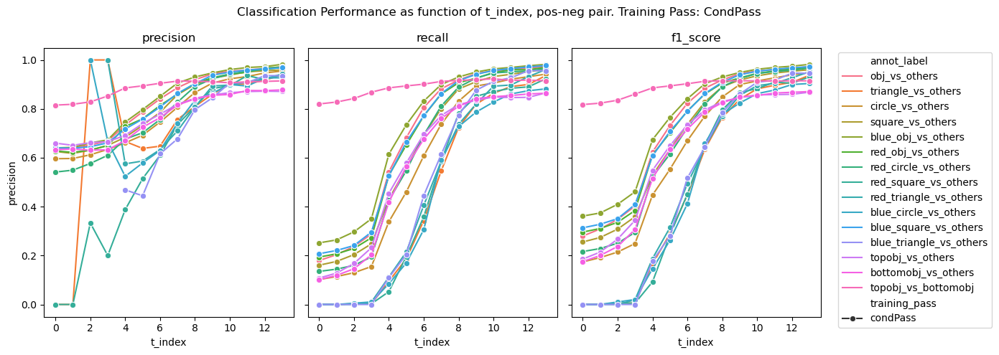

In [115]:
figh, axs = plt.subplots(1, 3, figsize=(14, 5), sharex=True, sharey=True)
for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("training_pass == 'condPass'"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers="o", ax=axs[i])
    axs[i].set_title(metric)
    if i == 2:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. Training Pass: CondPass")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

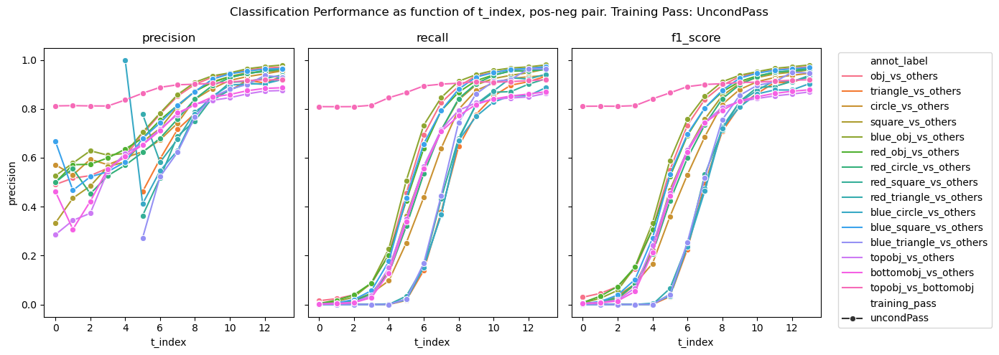

In [116]:
figh, axs = plt.subplots(1, 3, figsize=(14, 5), sharex=True, sharey=True)
for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("training_pass == 'uncondPass'"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers="o", ax=axs[i])
    axs[i].set_title(metric)
    if i == 2:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. Training Pass: UncondPass")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

/tmp/ipykernel_1980073/3604157387.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"),
/tmp/ipykernel_1980073/3604157387.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"),
/tmp/ipykernel_1980073/3604157387.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"),


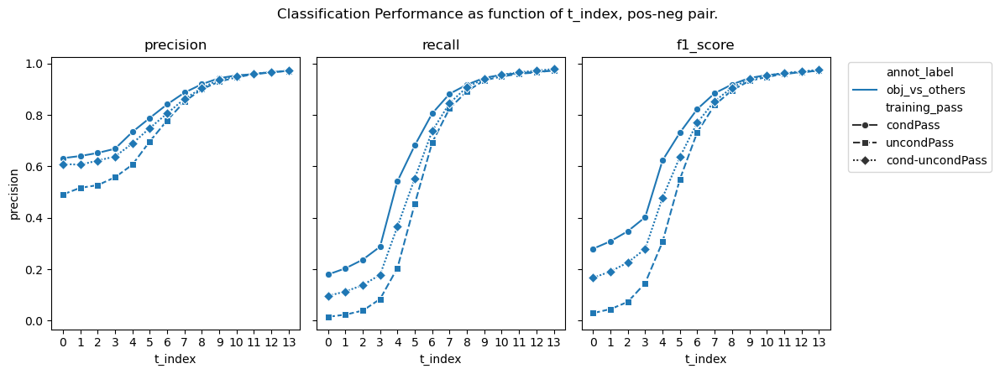

In [117]:
figh, axs = plt.subplots(1, 3, figsize=(12, 4.5), sharex=True, sharey=True)
for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers=["o", "s", "D", "P", "X"], ax=axs[i])
    axs[i].set_xticks(range(14))
    axs[i].set_title(metric)
    if axs[i] == axs[-1]:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. ")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

/tmp/ipykernel_1980073/3438416097.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"),
/tmp/ipykernel_1980073/3438416097.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"),
/tmp/ipykernel_1980073/3438416097.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"),
/tmp/ipykernel_1980073/3438416097.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"),
/tmp/ipykernel_1980073/3438416097.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_o

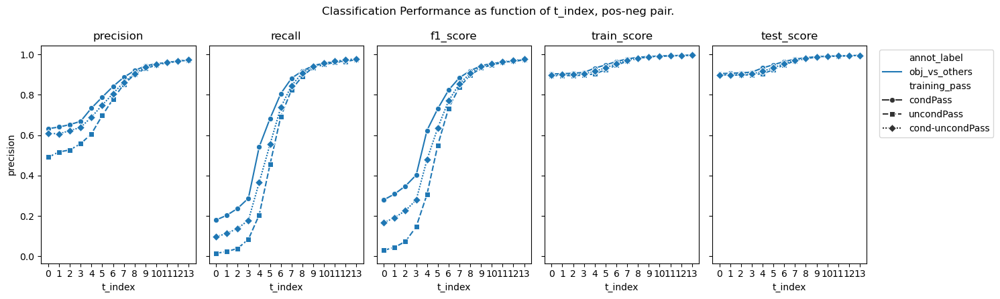

In [118]:
figh, axs = plt.subplots(1, 5, figsize=(15, 4.5), sharex=True, sharey=True)
for i, metric in enumerate(["precision", "recall", "f1_score", "train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("annot_label == 'obj_vs_others'"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers=["o", "s", "D", "P", "X"], ax=axs[i])
    axs[i].set_xticks(range(14))
    axs[i].set_title(metric)
    if axs[i] == axs[-1]:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. ")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

/tmp/ipykernel_1980073/1293681745.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"),
/tmp/ipykernel_1980073/1293681745.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"),
/tmp/ipykernel_1980073/1293681745.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"),


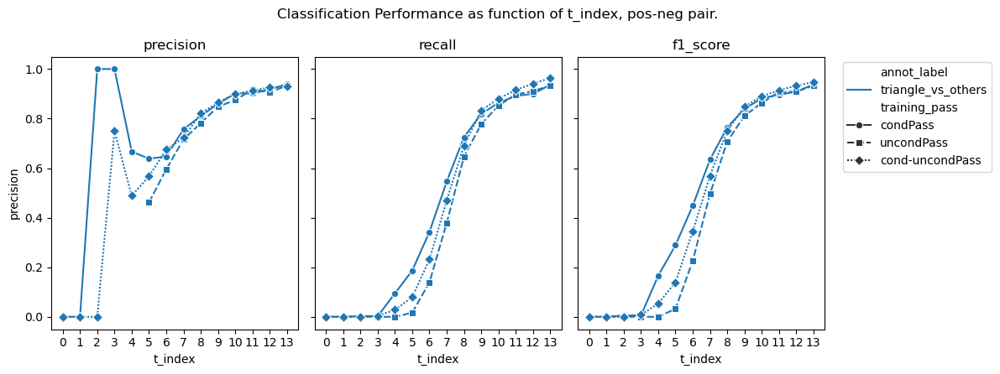

In [119]:
figh, axs = plt.subplots(1, 3, figsize=(12, 4.5), sharex=True, sharey=True)
for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers=["o", "s", "D", "P", "X"], ax=axs[i])
    axs[i].set_xticks(range(14))
    axs[i].set_title(metric)
    if axs[i] == axs[-1]:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. ")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

/tmp/ipykernel_1980073/1589372882.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"),
/tmp/ipykernel_1980073/1589372882.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"),
/tmp/ipykernel_1980073/1589372882.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"),
/tmp/ipykernel_1980073/1589372882.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"),
/tmp/ipykernel_1980073/1589372882.py:3: UserWarning: The markers list has more values (5) than needed (3), which may not be intended.
  sns.lineplot(data=syn_df.query("anno

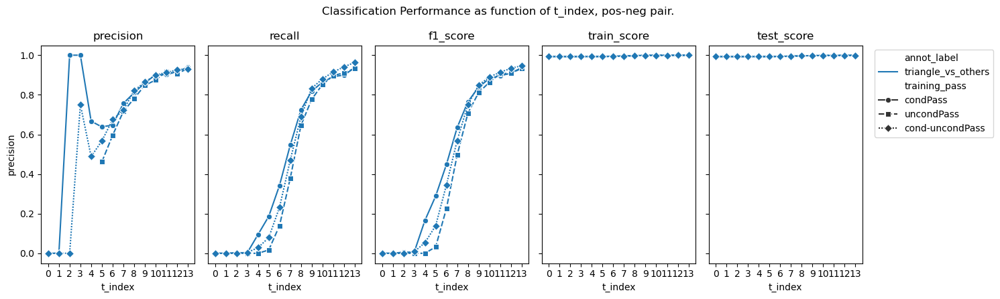

In [120]:
figh, axs = plt.subplots(1, 5, figsize=(15, 4.5), sharex=True, sharey=True)
for i, metric in enumerate(["precision", "recall", "f1_score", "train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("annot_label == 'triangle_vs_others'"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers=["o", "s", "D", "P", "X"], ax=axs[i])
    axs[i].set_xticks(range(14))
    axs[i].set_title(metric)
    if axs[i] == axs[-1]:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. ")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

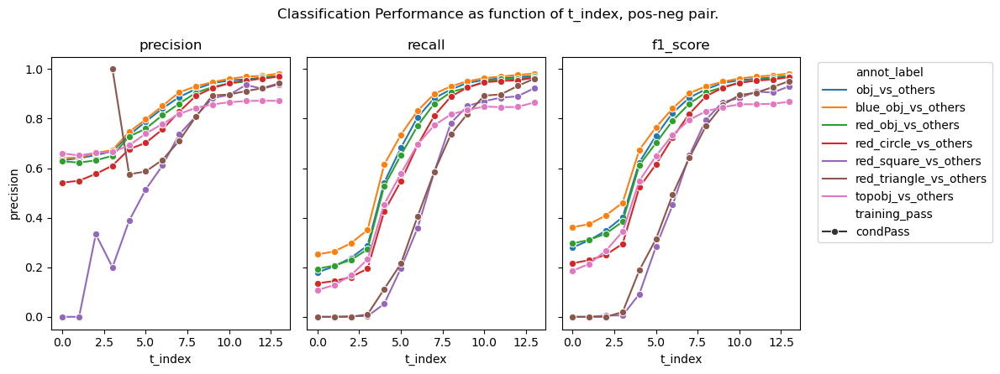

In [126]:
figh, axs = plt.subplots(1, 3, figsize=(12, 4.5), sharex=True, sharey=True)
selected_annot_label = ["obj_vs_others", "red_obj_vs_others", "blue_obj_vs_others", "topobj_vs_others", "red_square_vs_others", "red_triangle_vs_others", "red_circle_vs_others"]
# selected_annot_label = ["obj_vs_others", "triangle_vs_others", "square_vs_others", "circle_vs_others"]
for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("annot_label in @selected_annot_label and training_pass == 'condPass'"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers="o", ax=axs[i])
    axs[i].set_title(metric)
    if i == 2:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. ")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

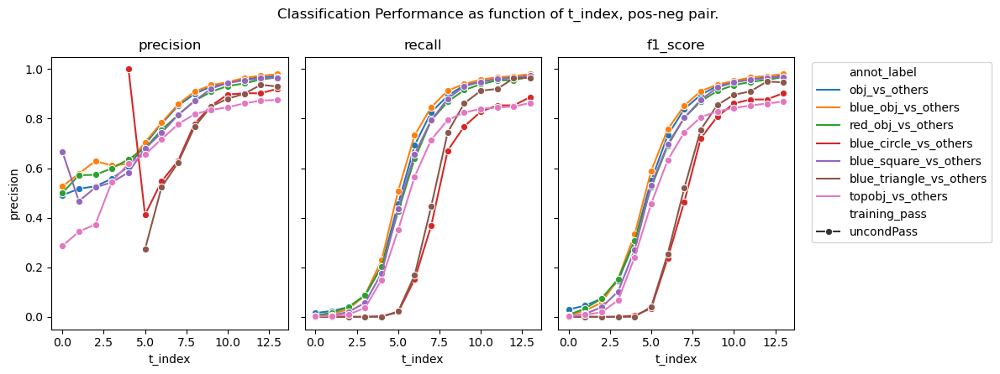

In [130]:
figh, axs = plt.subplots(1, 3, figsize=(12, 4.5), sharex=True, sharey=True)
selected_annot_label = ["obj_vs_others", "red_obj_vs_others", "blue_obj_vs_others", "topobj_vs_others", "blue_square_vs_others", "blue_triangle_vs_others", "blue_circle_vs_others"]
# selected_annot_label = ["obj_vs_others", "triangle_vs_others", "square_vs_others", "circle_vs_others"]
for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("annot_label in @selected_annot_label and training_pass == 'uncondPass'"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers="o", ax=axs[i])
    axs[i].set_title(metric)
    if i == 2:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. ")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

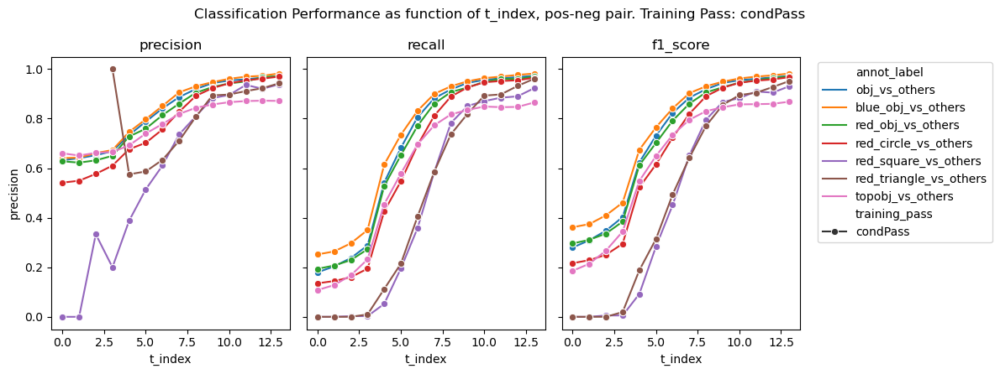

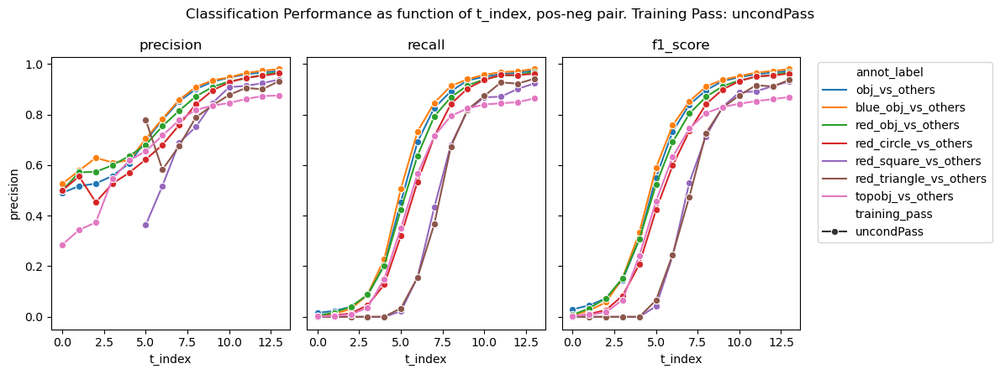

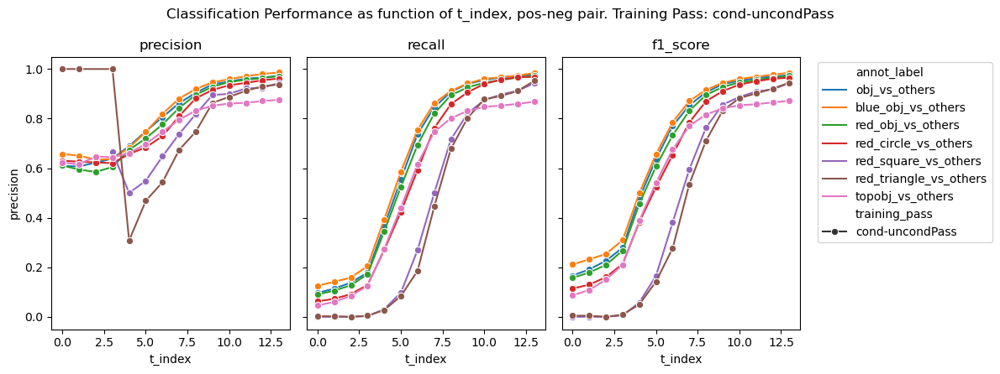

In [132]:
for training_pass in ["condPass", "uncondPass", "cond-uncondPass"]:
    figh, axs = plt.subplots(1, 3, figsize=(12, 4.5), sharex=True, sharey=True)
    selected_annot_label = ["obj_vs_others", "red_obj_vs_others", "blue_obj_vs_others", "topobj_vs_others", "red_square_vs_others", "red_triangle_vs_others", "red_circle_vs_others"]
    for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
        sns.lineplot(data=syn_df.query("annot_label in @selected_annot_label and training_pass == @training_pass"), 
                    x="t_index", y=metric, style="training_pass", 
                    hue="annot_label", markers="o", ax=axs[i])
        axs[i].set_title(metric)
        if i == 2:  # For the last panel
            axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        else:
            axs[i].legend().remove()
    plt.suptitle(f"Classification Performance as function of t_index, pos-neg pair. Training Pass: {training_pass}")
    plt.tight_layout()  # Adjust layout to prevent legend overlap
    plt.show()

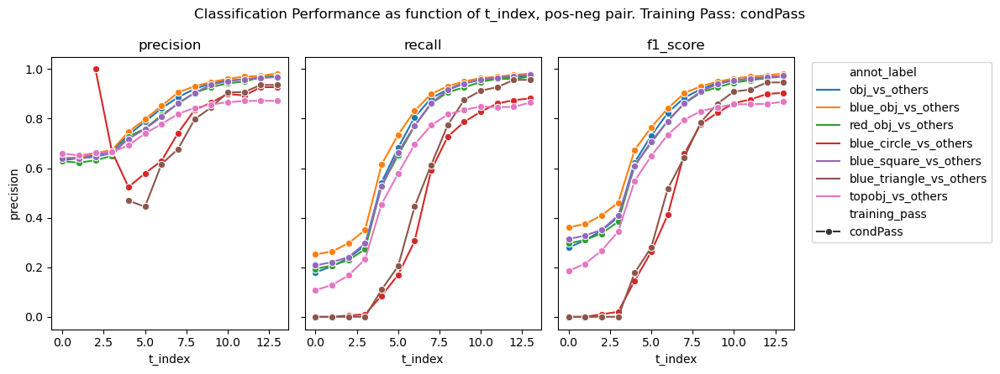

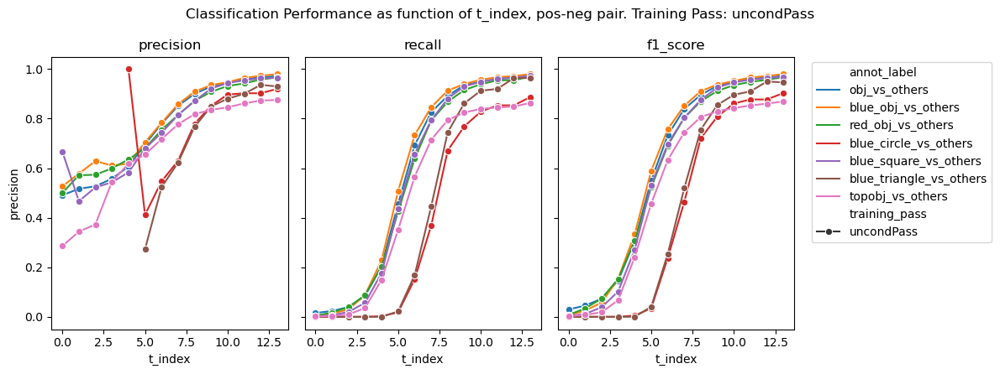

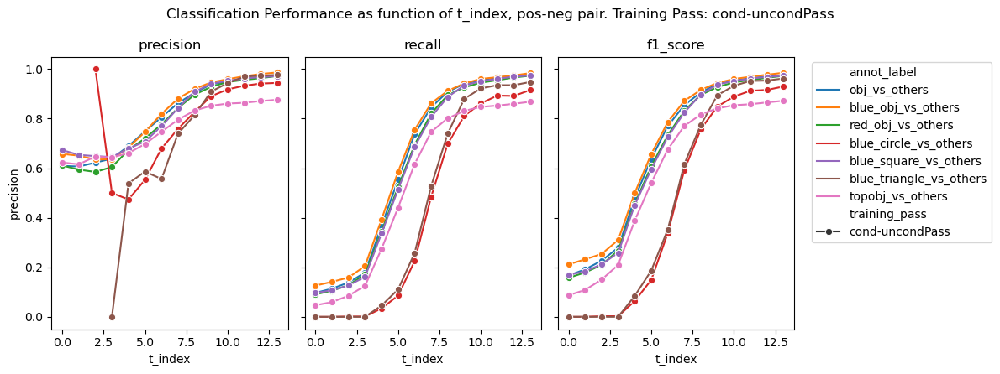

In [131]:
for training_pass in ["condPass", "uncondPass", "cond-uncondPass"]:
    figh, axs = plt.subplots(1, 3, figsize=(12, 4.5), sharex=True, sharey=True)
    selected_annot_label = ["obj_vs_others", "red_obj_vs_others", "blue_obj_vs_others", "topobj_vs_others", "blue_square_vs_others", "blue_triangle_vs_others", "blue_circle_vs_others"]
    for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
        sns.lineplot(data=syn_df.query("annot_label in @selected_annot_label and training_pass == @training_pass"), 
                    x="t_index", y=metric, style="training_pass", 
                    hue="annot_label", markers="o", ax=axs[i])
        axs[i].set_title(metric)
        if i == 2:  # For the last panel
            axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        else:
            axs[i].legend().remove()
    plt.suptitle(f"Classification Performance as function of t_index, pos-neg pair. Training Pass: {training_pass}")
    plt.tight_layout()  # Adjust layout to prevent legend overlap
    plt.show()

/tmp/ipykernel_2156354/654861112.py:2: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df, x="t_index", y="precision", style="training_pass", hue="annot_label", markers="o")


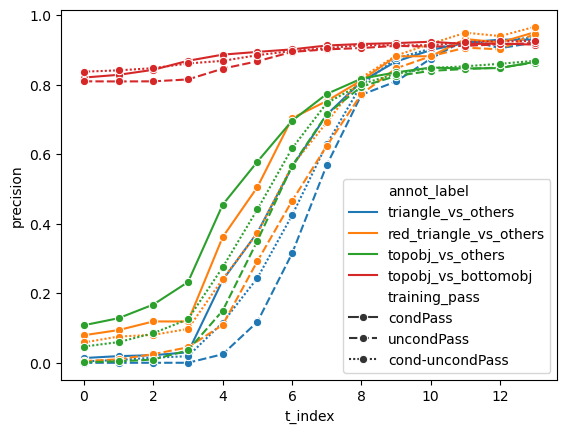

/tmp/ipykernel_2156354/654861112.py:4: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df, x="t_index", y="recall", style="training_pass", hue="annot_label", markers="o")


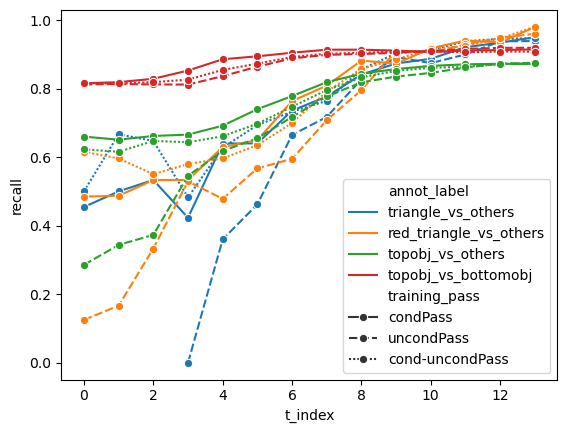

/tmp/ipykernel_2156354/654861112.py:6: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df, x="t_index", y="f1_score", style="training_pass", hue="annot_label", markers="o")


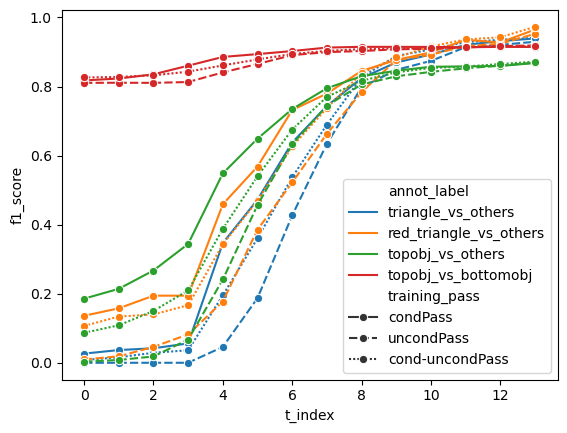

In [ ]:

# sns.set_theme(style="whitegrid")
sns.lineplot(data=syn_df, x="t_index", y="precision", style="training_pass", hue="annot_label", markers="o")
plt.show()
sns.lineplot(data=syn_df, x="t_index", y="recall", style="training_pass", hue="annot_label", markers="o")
plt.show()
sns.lineplot(data=syn_df, x="t_index", y="f1_score", style="training_pass", hue="annot_label", markers="o")
plt.show()

/tmp/ipykernel_1980073/437151702.py:4: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df.query("annot_label in @selected_annot_label"),
/tmp/ipykernel_1980073/437151702.py:4: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df.query("annot_label in @selected_annot_label"),
/tmp/ipykernel_1980073/437151702.py:4: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df.query("annot_label in @selected_annot_label"),


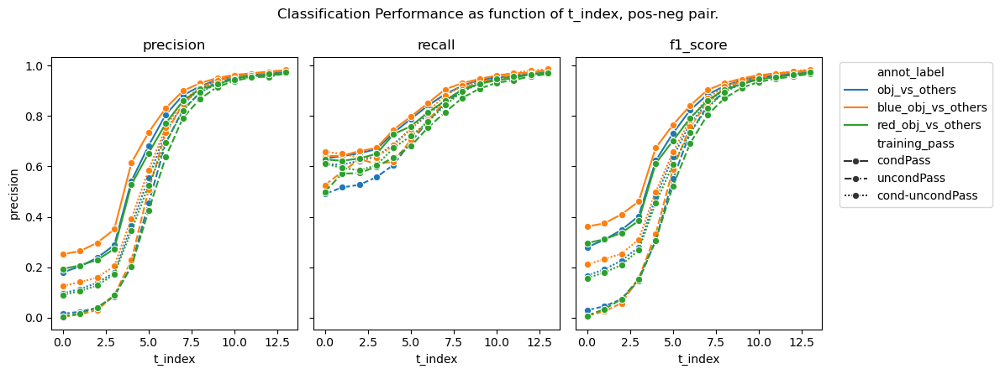

In [95]:
figh, axs = plt.subplots(1, 3, figsize=(12, 4.5), sharex=True, sharey=True)
selected_annot_label = ["obj_vs_others", "red_obj_vs_others", "blue_obj_vs_others"]
for i, metric in enumerate(["precision", "recall", "f1_score"]):#"train_score", "test_score"]):
    sns.lineplot(data=syn_df.query("annot_label in @selected_annot_label"), 
                x="t_index", y=metric, style="training_pass", 
                hue="annot_label", markers="o", ax=axs[i])
    axs[i].set_title(metric)
    if i == 2:  # For the last panel
        axs[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        axs[i].legend().remove()
plt.suptitle("Classification Performance as function of t_index, pos-neg pair. ")
plt.tight_layout()  # Adjust layout to prevent legend overlap
plt.show()

/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],


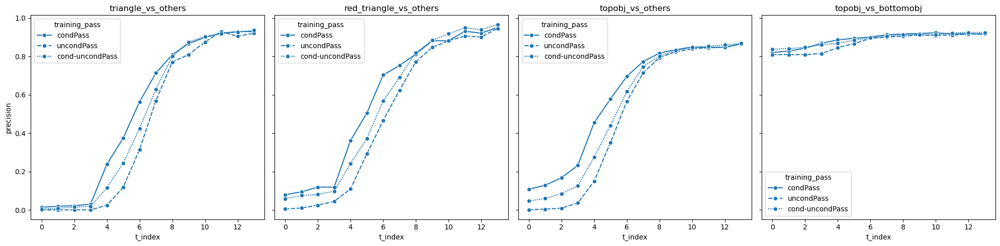

/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],


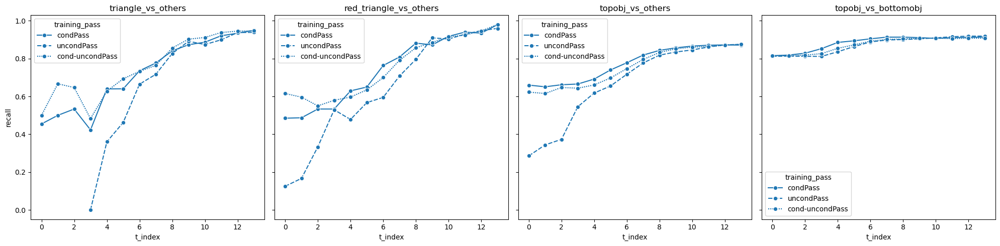

/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],


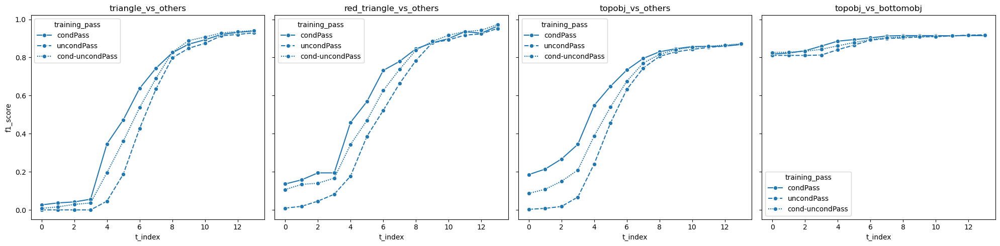

/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],


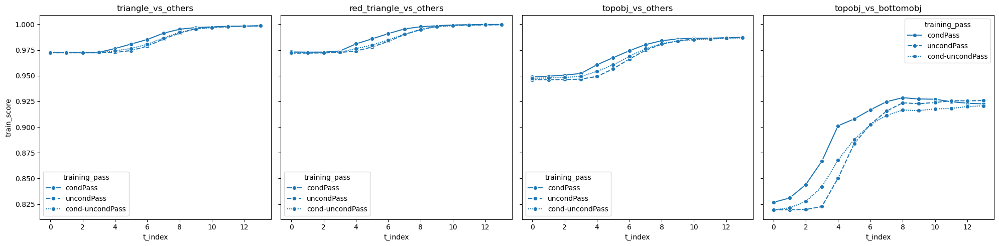

/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],
/tmp/ipykernel_2156354/4203768328.py:5: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df[syn_df.annot_label == label],


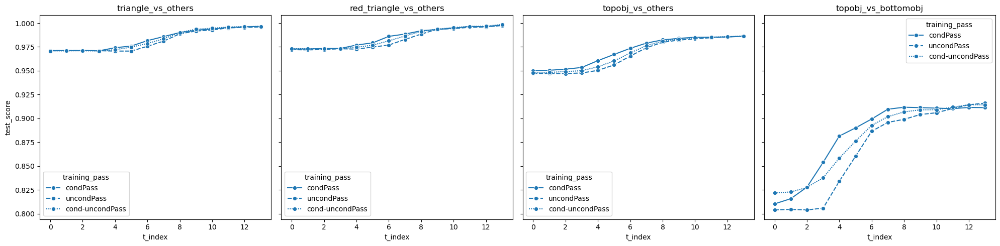

In [49]:
# sns.set_theme(style="whitegrid")
for metric in ["precision", "recall", "f1_score", "train_score", "test_score"]:
    fig, axes = plt.subplots(1, 4, figsize=(20, 5), sharex=True, sharey=True)
    for i, label in enumerate(["triangle_vs_others", "red_triangle_vs_others", "topobj_vs_others", "topobj_vs_bottomobj"]):
        sns.lineplot(data=syn_df[syn_df.annot_label == label], 
                    x="t_index", y=metric, style="training_pass", markers="o", ax=axes[i])
        axes[i].set_title(label)
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_2156354/1213997058.py:4: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df, x="t_index", y="train_score", # .query("training_pass == 'cond-uncondPass'")


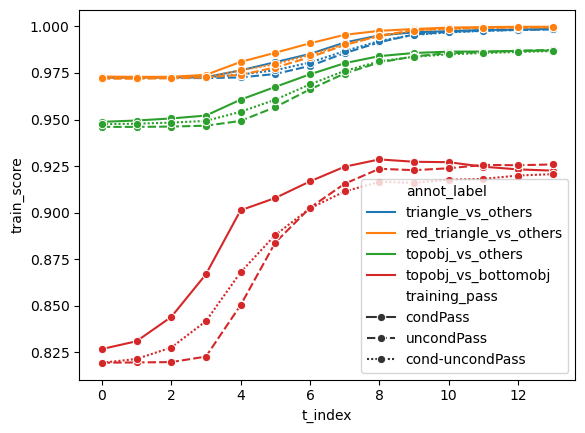

/tmp/ipykernel_2156354/1213997058.py:7: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df, x="t_index", y="test_score", # .query("training_pass == 'cond-uncondPass'")


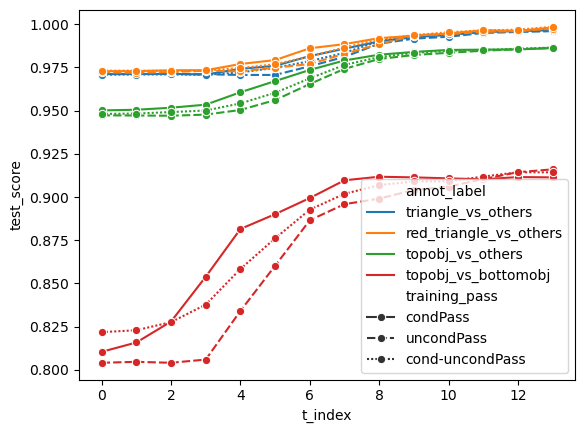

In [12]:
sns.lineplot(data=syn_df, x="t_index", y="train_score", # .query("training_pass == 'cond-uncondPass'")
                    style="training_pass", hue="annot_label", markers="o")
plt.show()
sns.lineplot(data=syn_df, x="t_index", y="test_score", # .query("training_pass == 'cond-uncondPass'")
                    style="training_pass", hue="annot_label", markers="o")
plt.show()

/tmp/ipykernel_2156354/2429721325.py:4: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df, x="t_index", y="precision", style="training_pass", hue="annot_label", markers="o") # .query("training_pass == 'cond-uncondPass'")


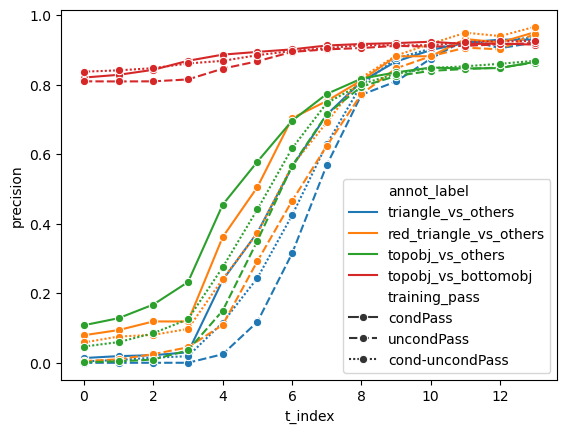

/tmp/ipykernel_2156354/2429721325.py:6: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df, x="t_index", y="recall", style="training_pass", hue="annot_label", markers="o") # .query("training_pass == 'cond-uncondPass'")


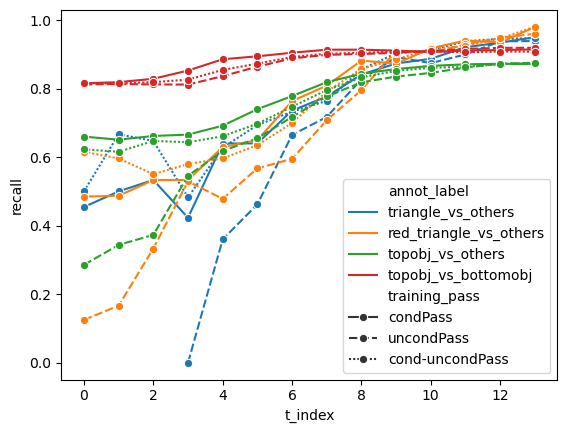

/tmp/ipykernel_2156354/2429721325.py:8: UserWarning: 
The markers list has fewer values (1) than needed (3) and will cycle, which may produce an uninterpretable plot.
  sns.lineplot(data=syn_df, x="t_index", y="f1_score", style="training_pass", hue="annot_label", markers="o") # .query("training_pass == 'cond-uncondPass'")


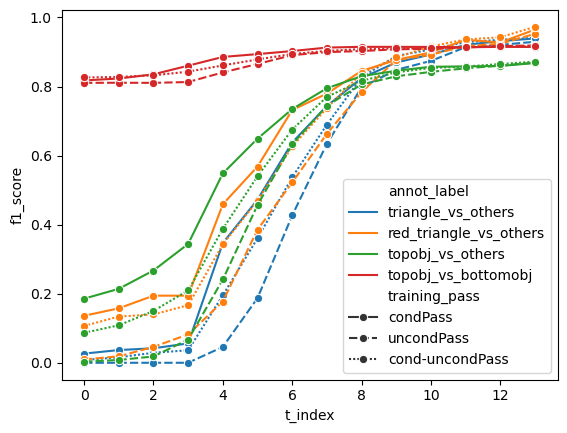

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
# sns.set_theme(style="whitegrid")
sns.lineplot(data=syn_df, x="t_index", y="precision", style="training_pass", hue="annot_label", markers="o") # .query("training_pass == 'cond-uncondPass'")
plt.show()
sns.lineplot(data=syn_df, x="t_index", y="recall", style="training_pass", hue="annot_label", markers="o") # .query("training_pass == 'cond-uncondPass'")
plt.show()
sns.lineplot(data=syn_df, x="t_index", y="f1_score", style="training_pass", hue="annot_label", markers="o") # .query("training_pass == 'cond-uncondPass'")
plt.show()

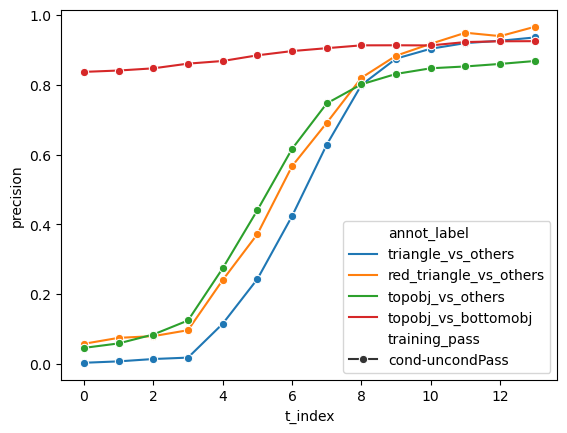

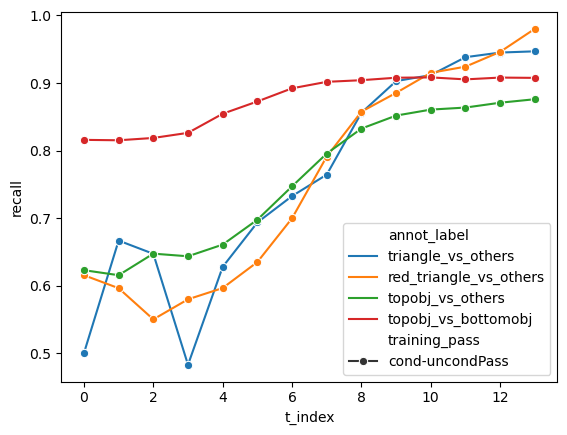

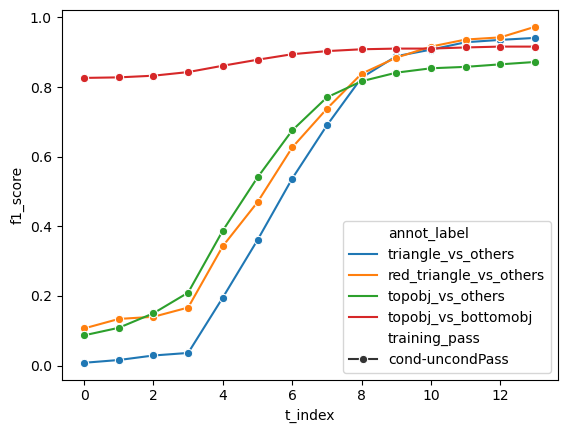

In [20]:

sns.lineplot(data=syn_df.query("training_pass == 'cond-uncondPass'"), x="t_index", y="precision", style="training_pass", hue="annot_label", markers="o")
plt.show()
sns.lineplot(data=syn_df.query("training_pass == 'cond-uncondPass'"), x="t_index", y="recall", style="training_pass", hue="annot_label", markers="o")
plt.show()
sns.lineplot(data=syn_df.query("training_pass == 'cond-uncondPass'"), x="t_index", y="f1_score", style="training_pass", hue="annot_label", markers="o")
plt.show()

## Geometry and dynamics via cosine similarity

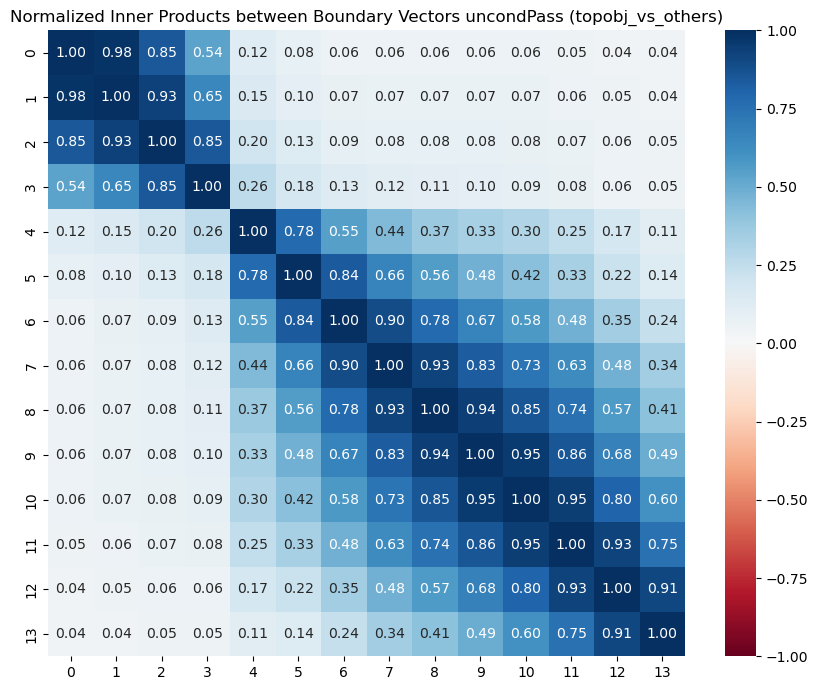

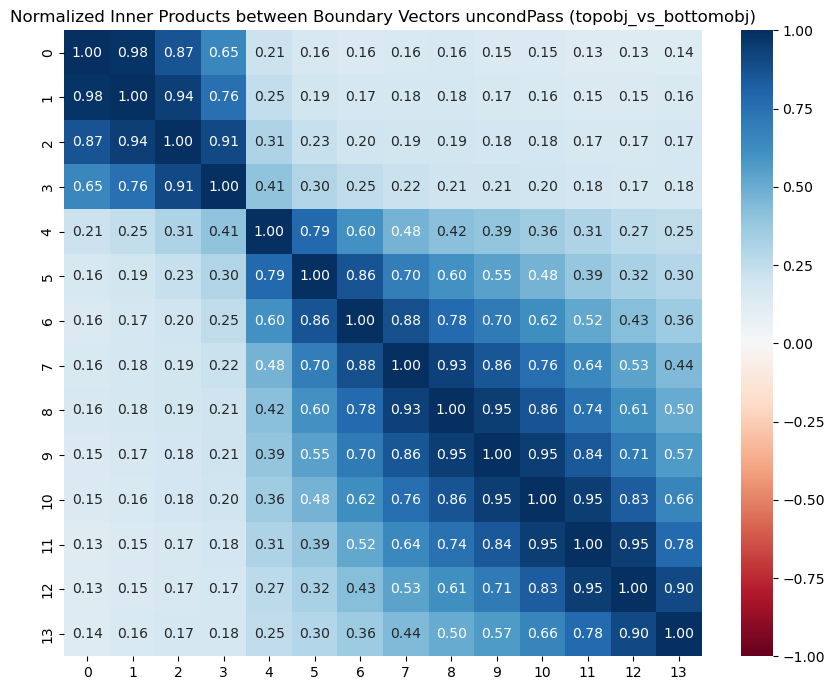

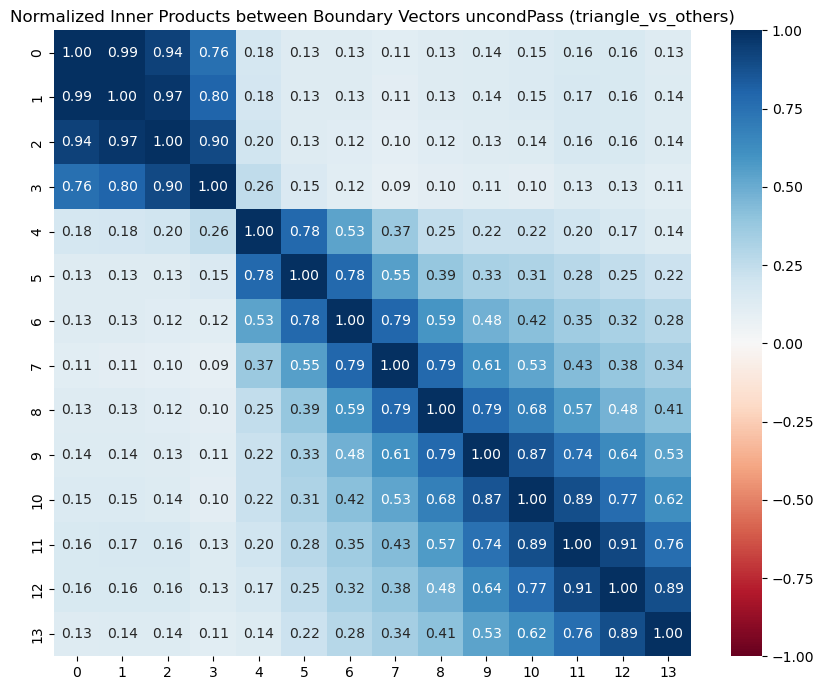

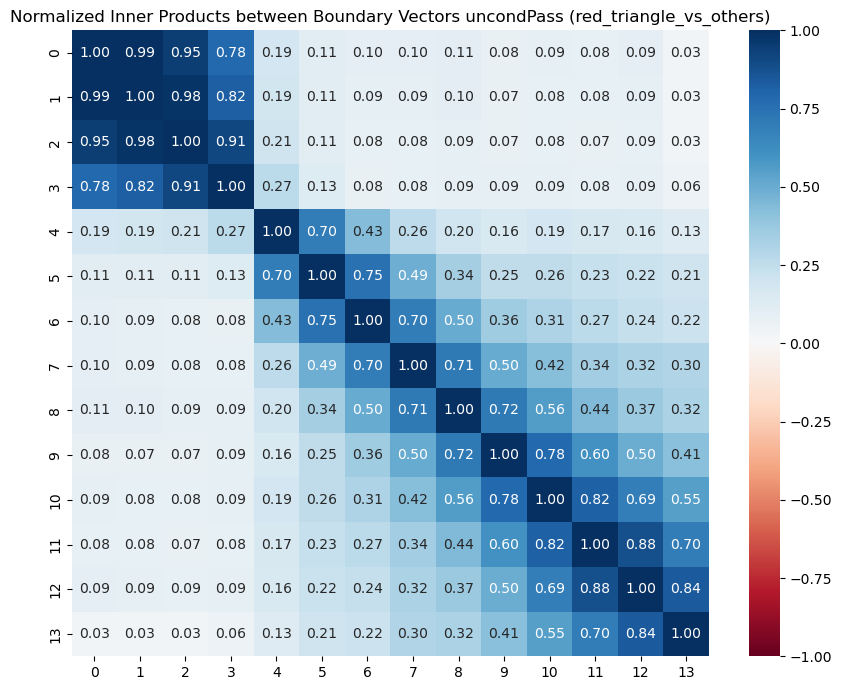

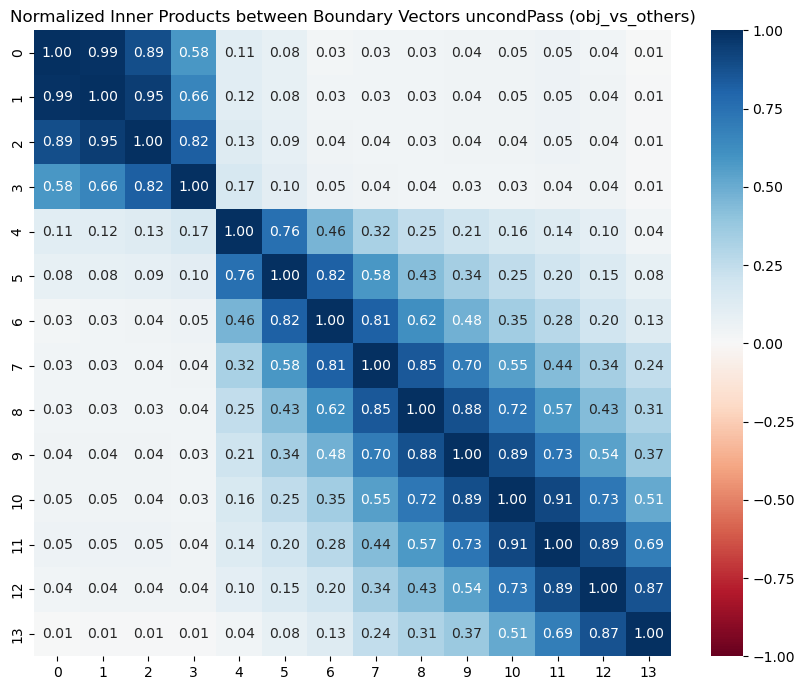

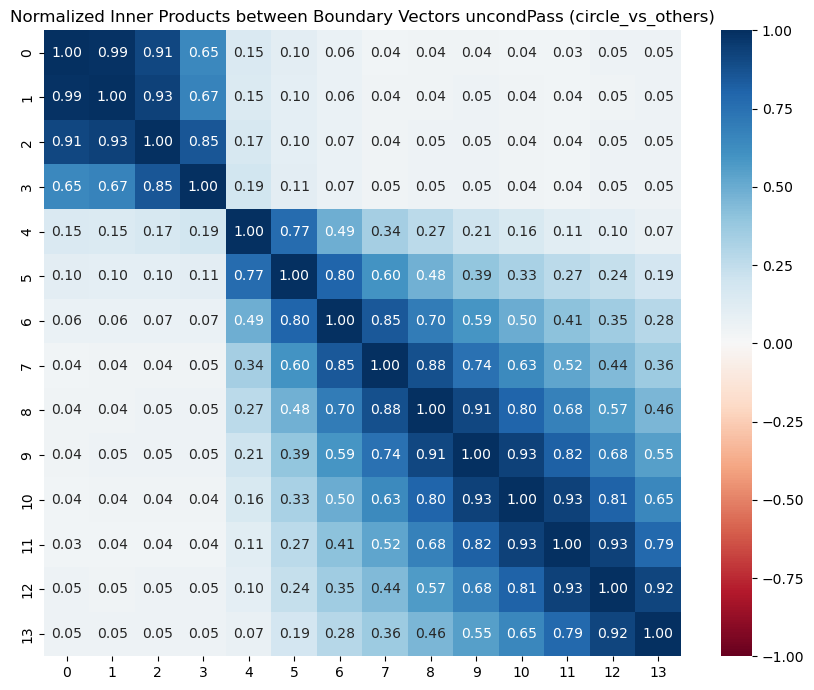

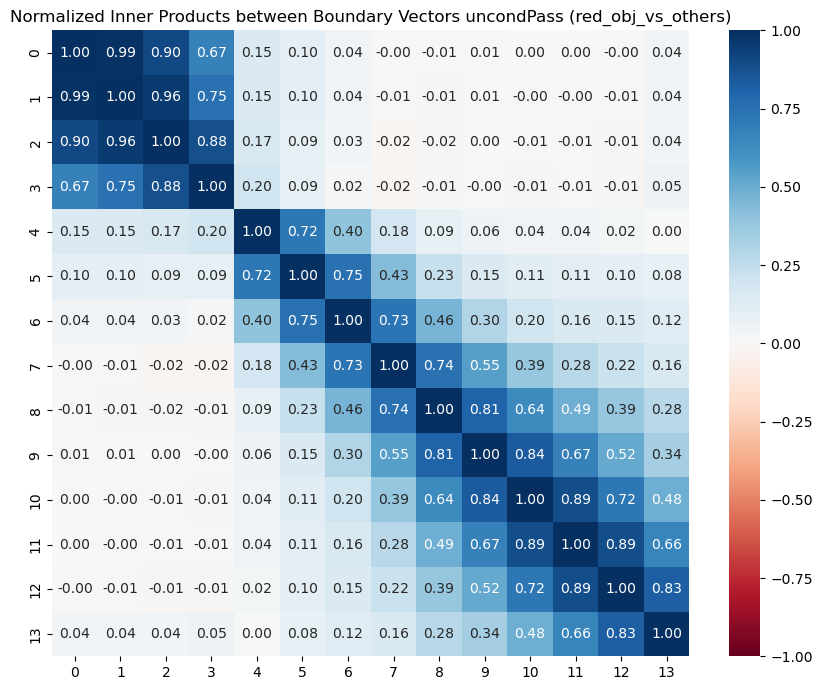

In [10]:
# Compute inner products between boundary vectors for each t_index
# Filter data for current t_index and cond-uncondPass
for annot_label in ["topobj_vs_others", "topobj_vs_bottomobj", 
                    "triangle_vs_others", "red_triangle_vs_others",
                    "obj_vs_others", "circle_vs_others", "red_obj_vs_others"]:
    df_subsel = syn_df.query("annot_label == @annot_label and training_pass == 'condPass'")
    df_subsel = df_subsel.sort_values(by="t_index")
    # Extract boundary vectors and labels
    vectors = np.stack(df_subsel['boundary_vector'].values)
    labels = df_subsel['t_index'].values

    # Compute normalized inner products
    norm_vectors = vectors / np.linalg.norm(vectors, axis=1)[:, None]
    inner_products = norm_vectors @ norm_vectors.T

    # Create heatmap
    plt.figure(figsize=(8.5, 7))
    sns.heatmap(inner_products, 
                xticklabels=labels, 
                yticklabels=labels,
                annot=True, 
                fmt='.2f',
                cmap='RdBu',
                vmin=-1, 
                vmax=1,
                center=0)
    plt.title(f'Normalized Inner Products between Boundary Vectors uncondPass ({annot_label})')
    plt.tight_layout()
    plt.show()

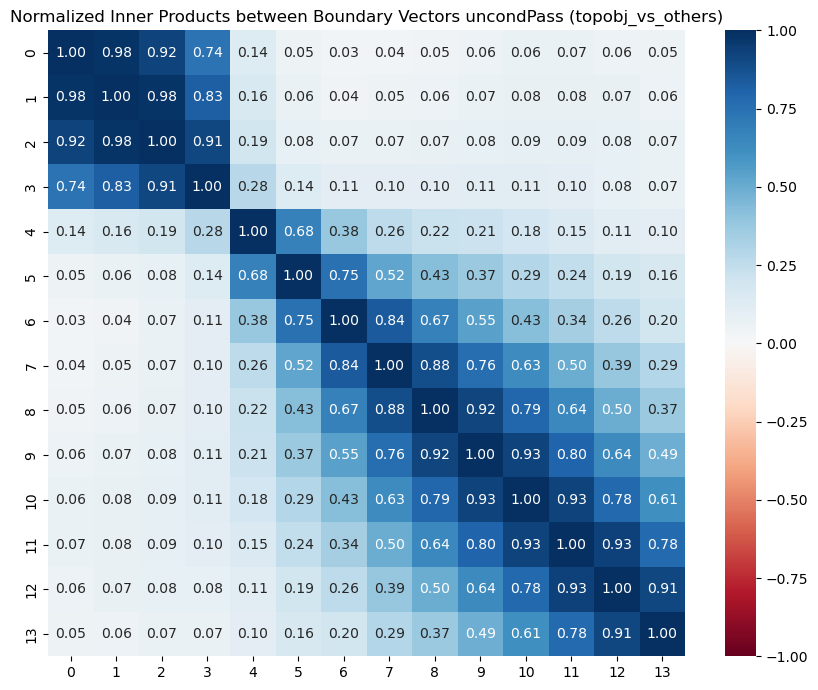

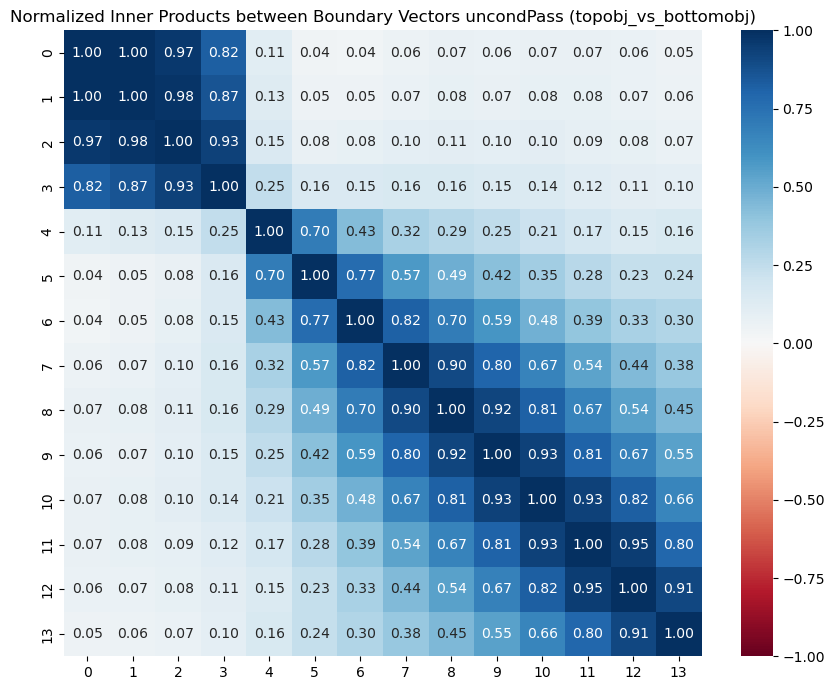

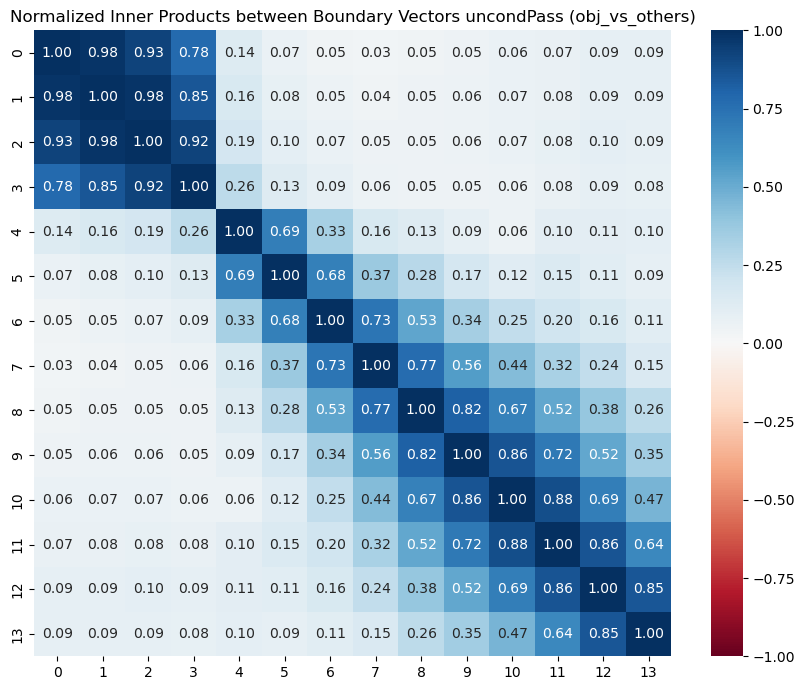

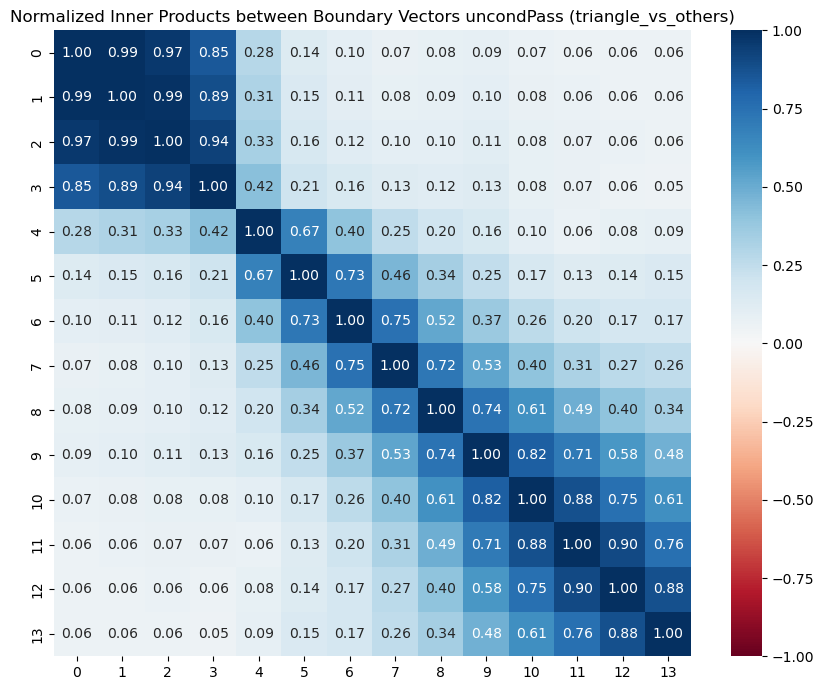

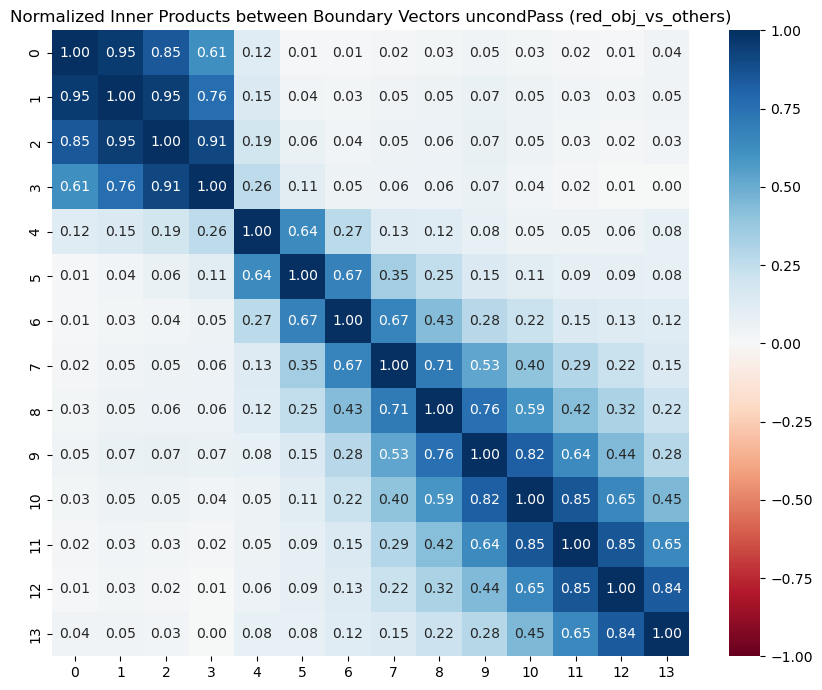

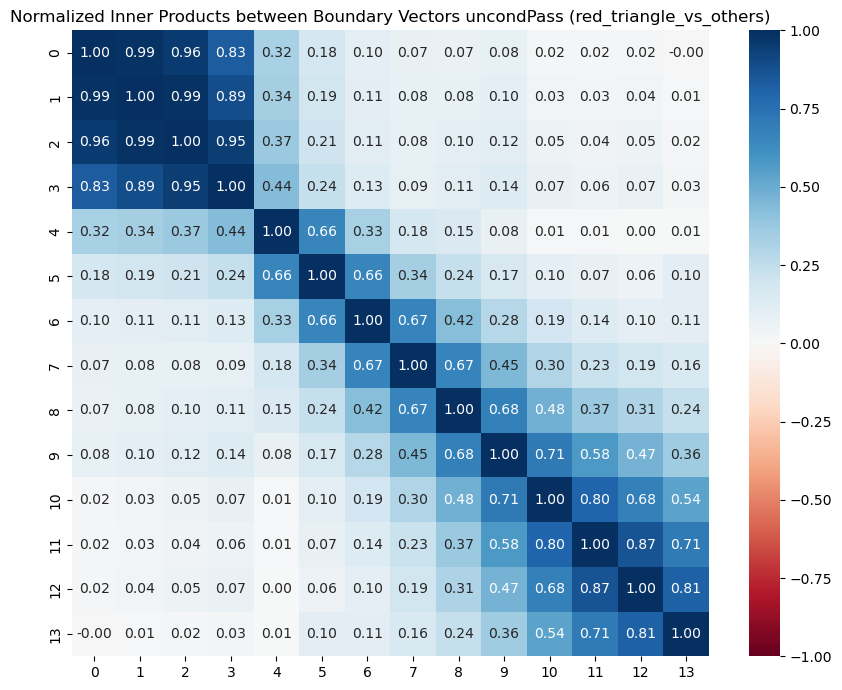

In [89]:
# Compute inner products between boundary vectors for each t_index
# Filter data for current t_index and cond-uncondPass
for annot_label in ["topobj_vs_others", "topobj_vs_bottomobj", "obj_vs_others", "triangle_vs_others", "red_obj_vs_others", "red_triangle_vs_others"]:
    df_subsel = syn_df.query("annot_label == @annot_label and training_pass == 'uncondPass'")
    df_subsel = df_subsel.sort_values(by="t_index")
    # Extract boundary vectors and labels
    vectors = np.stack(df_subsel['boundary_vector'].values)
    labels = df_subsel['t_index'].values

    # Compute normalized inner products
    norm_vectors = vectors / np.linalg.norm(vectors, axis=1)[:, None]
    inner_products = norm_vectors @ norm_vectors.T

    # Create heatmap
    plt.figure(figsize=(8.5, 7))
    sns.heatmap(inner_products, 
                xticklabels=labels, 
                yticklabels=labels,
                annot=True, 
                fmt='.2f',
                cmap='RdBu',
                vmin=-1, 
                vmax=1,
                center=0)
    plt.title(f'Normalized Inner Products between Boundary Vectors uncondPass ({annot_label})')
    plt.tight_layout()
    plt.show()

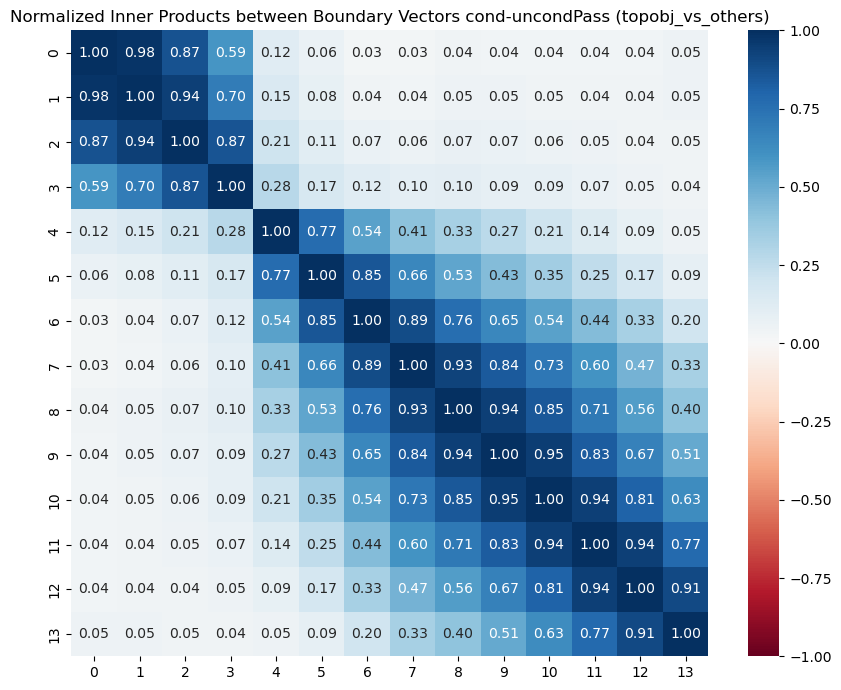

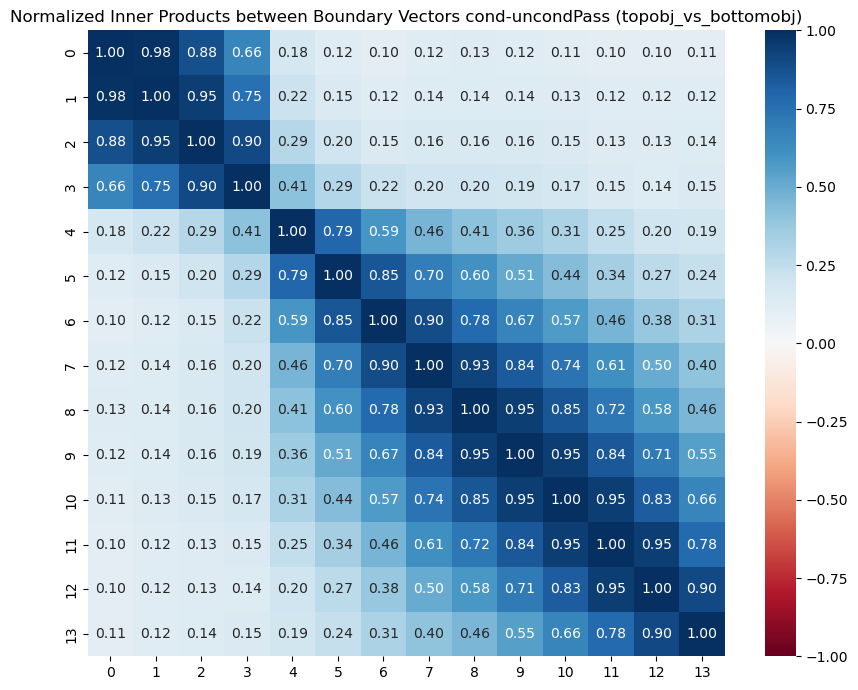

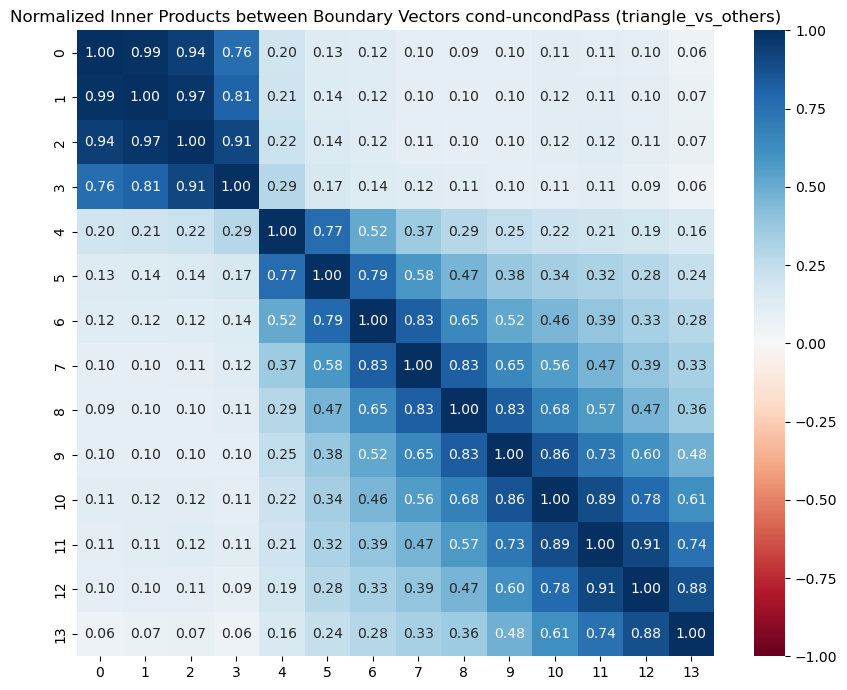

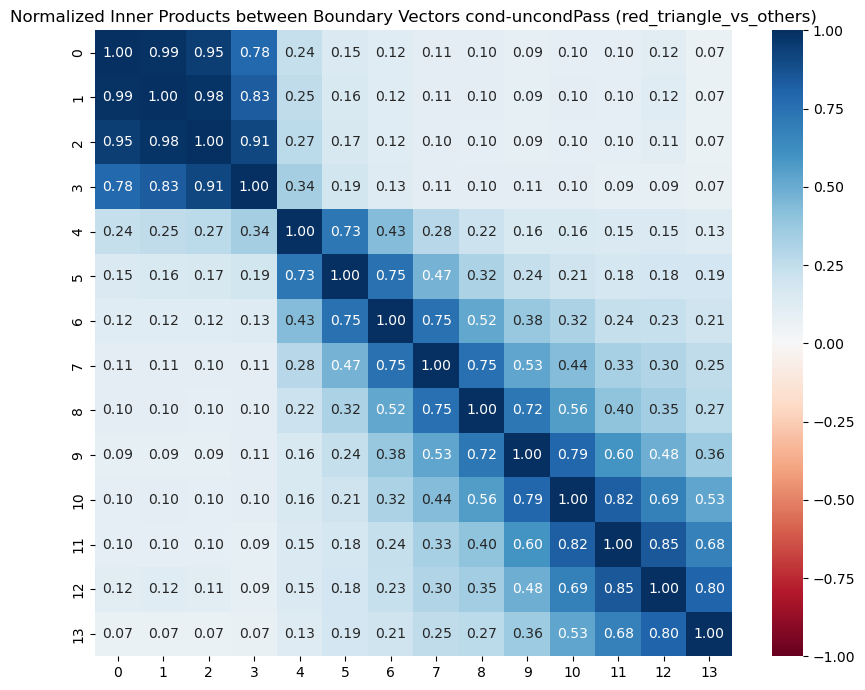

In [88]:
# Compute inner products between boundary vectors for each t_index
# Filter data for current t_index and cond-uncondPass
for annot_label in ["topobj_vs_others", "topobj_vs_bottomobj", "triangle_vs_others", "red_triangle_vs_others"]:
    df_subsel = syn_df.query("annot_label == @annot_label and training_pass == 'cond-uncondPass'")
    df_subsel = df_subsel.sort_values(by="t_index")
    # Extract boundary vectors and labels
    vectors = np.stack(df_subsel['boundary_vector'].values)
    labels = df_subsel['t_index'].values

    # Compute normalized inner products
    norm_vectors = vectors / np.linalg.norm(vectors, axis=1)[:, None]
    inner_products = norm_vectors @ norm_vectors.T

    # Create heatmap
    plt.figure(figsize=(8.5, 7))
    sns.heatmap(inner_products, 
                xticklabels=labels, 
                yticklabels=labels,
                annot=True, 
                fmt='.2f',
                cmap='RdBu',
                vmin=-1, 
                vmax=1,
                center=0)
    plt.title(f'Normalized Inner Products between Boundary Vectors cond-uncondPass ({annot_label})')
    plt.tight_layout()
    plt.show()

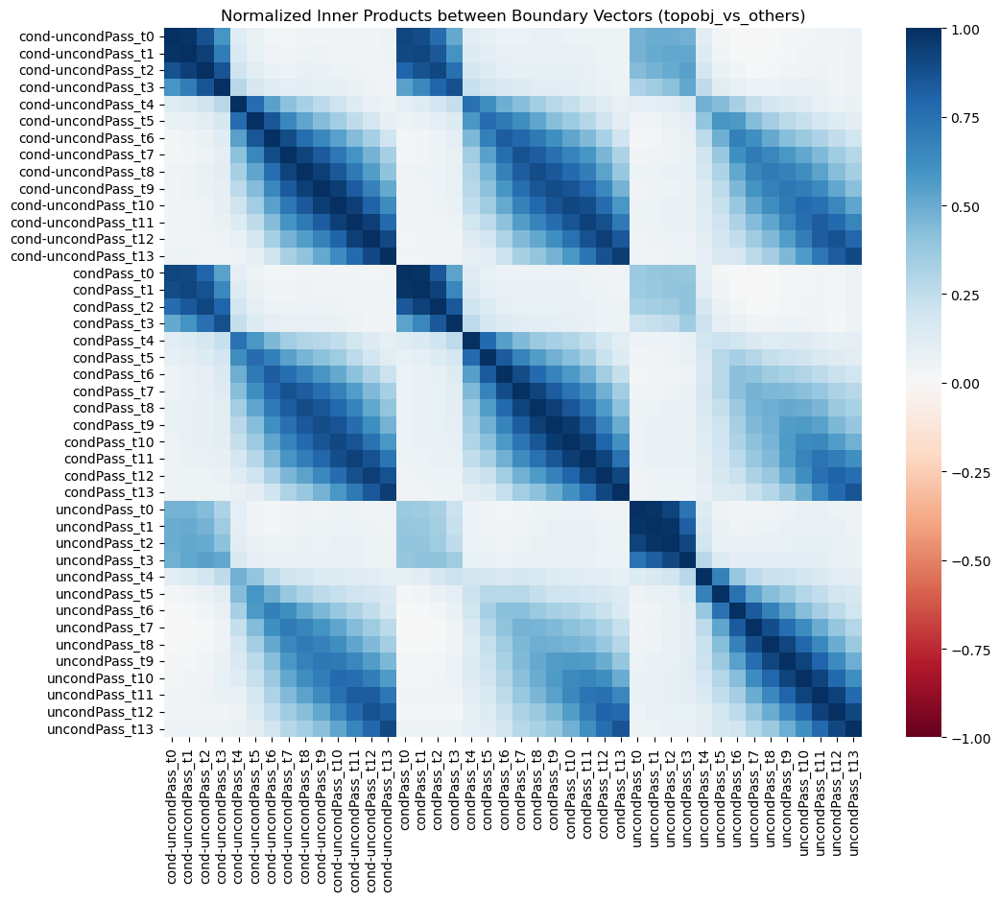

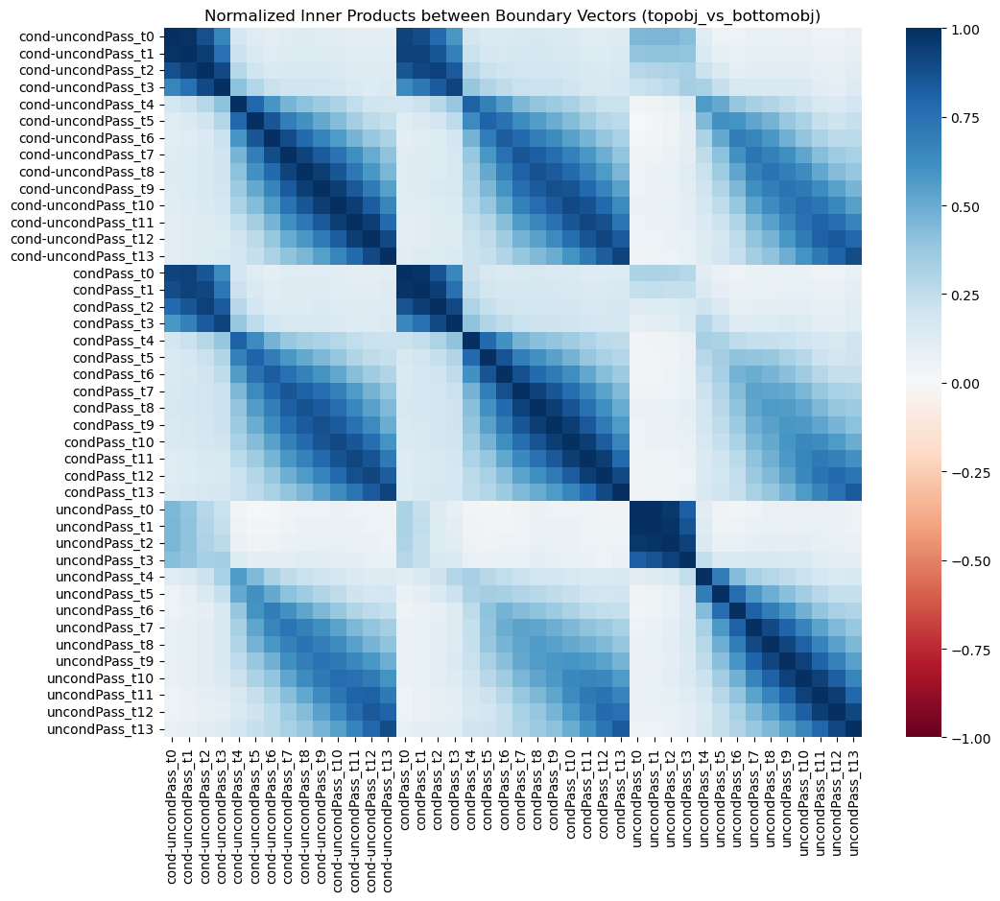

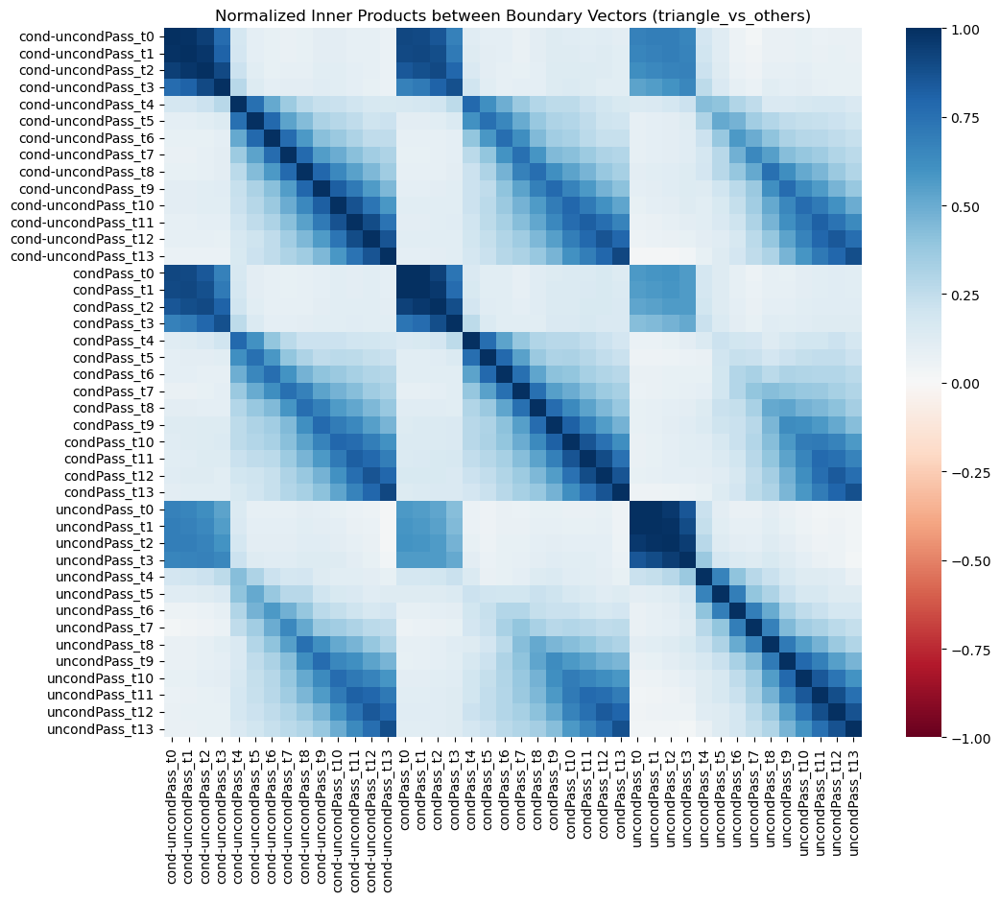

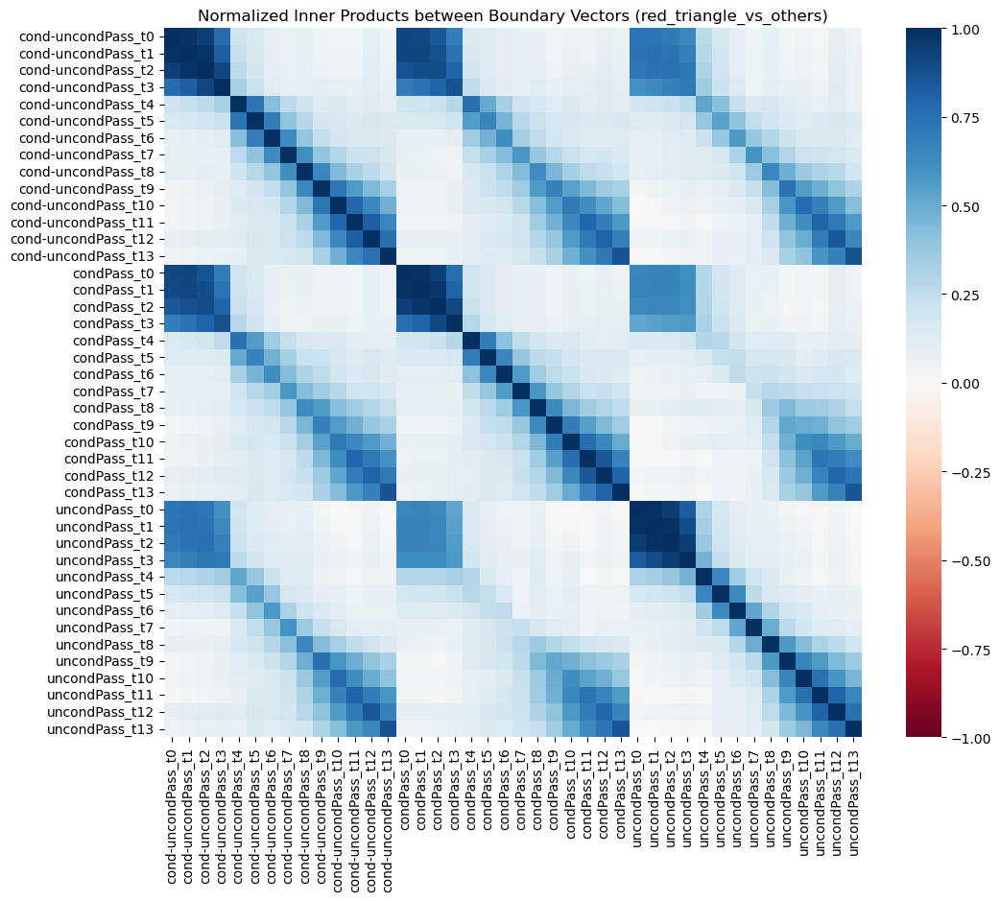

In [19]:
# Compute inner products between boundary vectors for each t_index
# ["triangle_vs_others", "red_triangle_vs_others", "topobj_vs_others", "topobj_vs_bottomobj"]
# for t_index in range(14):
# Filter data for current t_index and cond-uncondPass
for annot_label in ["topobj_vs_others", "topobj_vs_bottomobj", "triangle_vs_others", "red_triangle_vs_others"]:
    df_subsel = syn_df.query("annot_label == @annot_label")
    df_subsel = df_subsel.sort_values(by=["training_pass", "t_index"])
    # Extract boundary vectors and labels
    vectors = np.stack(df_subsel['boundary_vector'].values)
    labels = df_subsel['training_pass'].values + "_t" + df_subsel['t_index'].values.astype(str)
    
    # Compute normalized inner products
    norm_vectors = vectors / np.linalg.norm(vectors, axis=1)[:, None]
    inner_products = norm_vectors @ norm_vectors.T
    
    # Create heatmap
    plt.figure(figsize=(11, 9.5))
    sns.heatmap(inner_products, 
                xticklabels=labels, 
                yticklabels=labels,
                # annot=True, 
                # fmt='.2f',
                cmap='RdBu',
                vmin=-1, 
                vmax=1,
                center=0)
    plt.title(f'Normalized Inner Products between Boundary Vectors ({annot_label})')
    plt.tight_layout()
    plt.show()

### Geometry of classifying boundary vector with different meanings

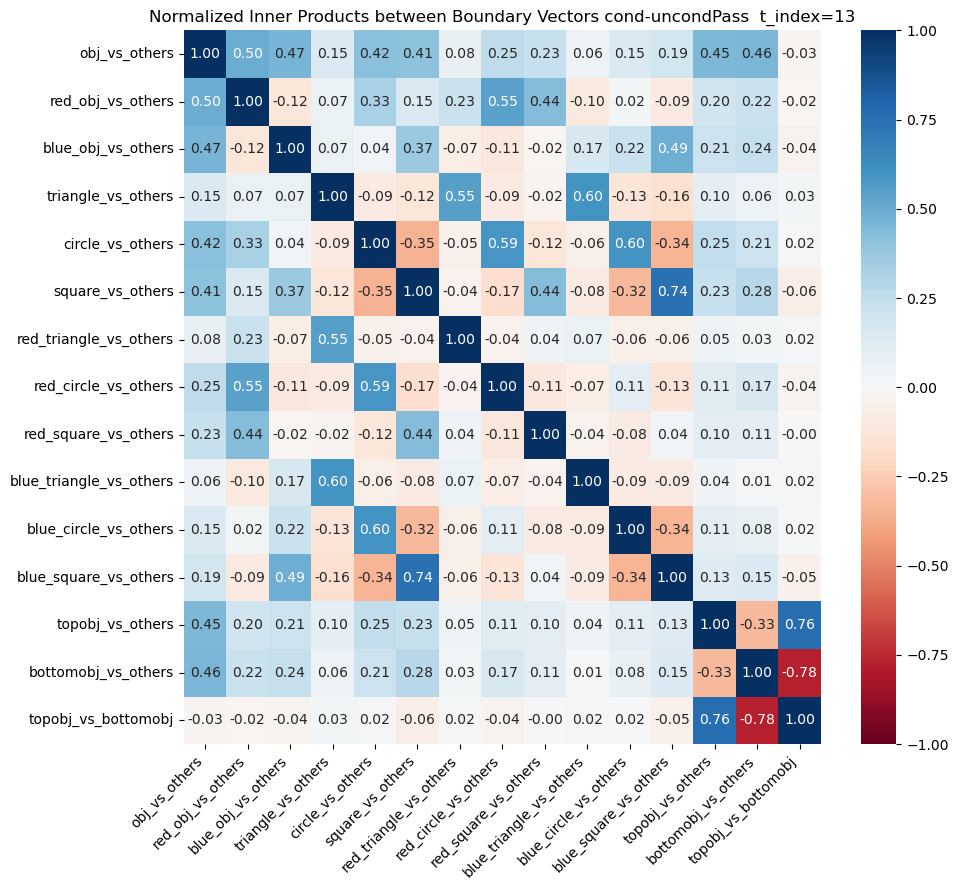

In [17]:
# Compute inner products between boundary vectors for each t_index
# Filter data for current t_index and cond-uncondPass
t_index = 13
# Define desired order of annotation labels
ordered_feature_names = [
    "obj_vs_others",
    "red_obj_vs_others",
    "blue_obj_vs_others",
    "triangle_vs_others", 
    "circle_vs_others",
    "square_vs_others", 
    "red_triangle_vs_others", 
    "red_circle_vs_others",
    "red_square_vs_others",
    "blue_triangle_vs_others",
    "blue_circle_vs_others", 
    "blue_square_vs_others",
    "topobj_vs_others", 
    "bottomobj_vs_others",
    "topobj_vs_bottomobj"
]
# Filter and sort data according to specified order
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'cond-uncondPass'")
df_subsel = df_subsel.set_index('annot_label').loc[ordered_feature_names].reset_index()

# Extract boundary vectors and labels
vectors = np.stack(df_subsel['boundary_vector'].values)
labels = df_subsel['annot_label'].values

# Compute normalized inner products
norm_vectors = vectors / np.linalg.norm(vectors, axis=1)[:, None]
inner_products = norm_vectors @ norm_vectors.T

# Create heatmap
plt.figure(figsize=(10, 9.))
sns.heatmap(inner_products, 
            xticklabels=labels, 
            yticklabels=labels,
            annot=True, 
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0)
plt.title(f'Normalized Inner Products between Boundary Vectors cond-uncondPass  t_index={t_index}')
# turn the xticks rotation to 45 degrees
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

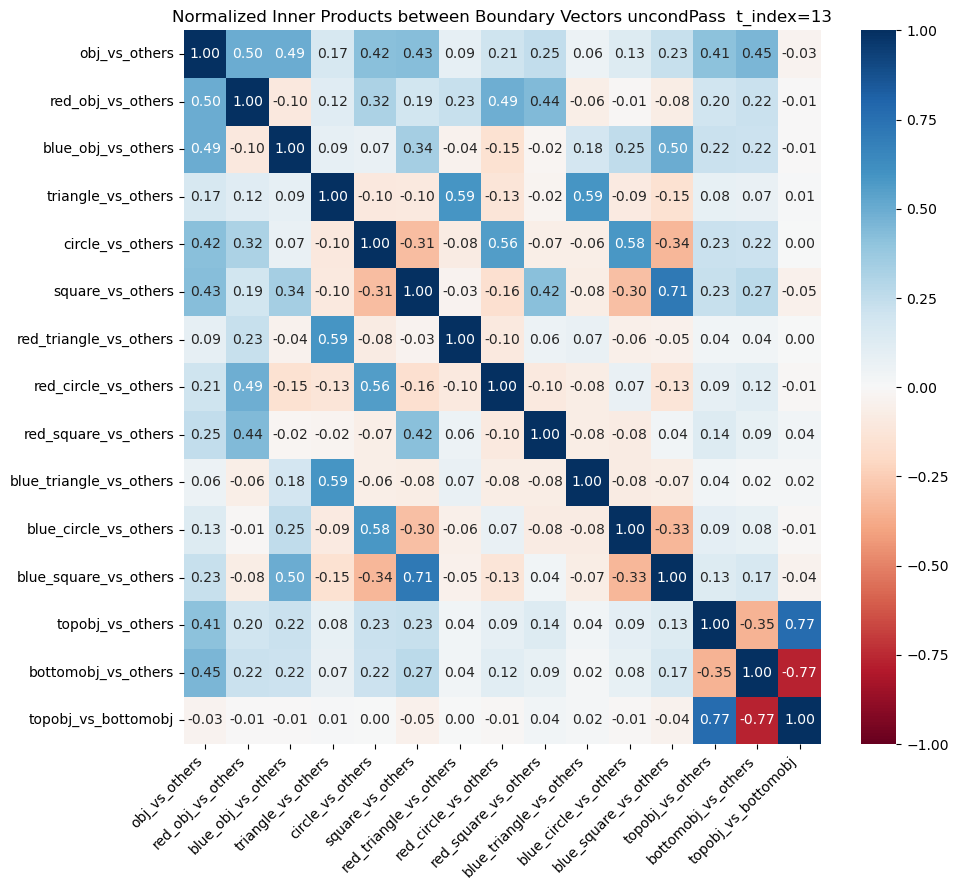

In [19]:
# Compute inner products between boundary vectors for each t_index
# Filter data for current t_index and cond-uncondPass
t_index = 13
# Define desired order of annotation labels
ordered_feature_names = [
    "obj_vs_others",
    "red_obj_vs_others",
    "blue_obj_vs_others",
    "triangle_vs_others", 
    "circle_vs_others",
    "square_vs_others", 
    "red_triangle_vs_others", 
    "red_circle_vs_others",
    "red_square_vs_others",
    "blue_triangle_vs_others",
    "blue_circle_vs_others", 
    "blue_square_vs_others",
    "topobj_vs_others", 
    "bottomobj_vs_others",
    "topobj_vs_bottomobj"
]
# Filter and sort data according to specified order
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'uncondPass'")
df_subsel = df_subsel.set_index('annot_label').loc[ordered_feature_names].reset_index()

# Extract boundary vectors and labels
vectors = np.stack(df_subsel['boundary_vector'].values)
labels = df_subsel['annot_label'].values

# Compute normalized inner products
norm_vectors = vectors / np.linalg.norm(vectors, axis=1)[:, None]
inner_products = norm_vectors @ norm_vectors.T

# Create heatmap
plt.figure(figsize=(10, 9.))
sns.heatmap(inner_products, 
            xticklabels=labels, 
            yticklabels=labels,
            annot=True, 
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0)
plt.title(f'Normalized Inner Products between Boundary Vectors uncondPass  t_index={t_index}')
# turn the xticks rotation to 45 degrees
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

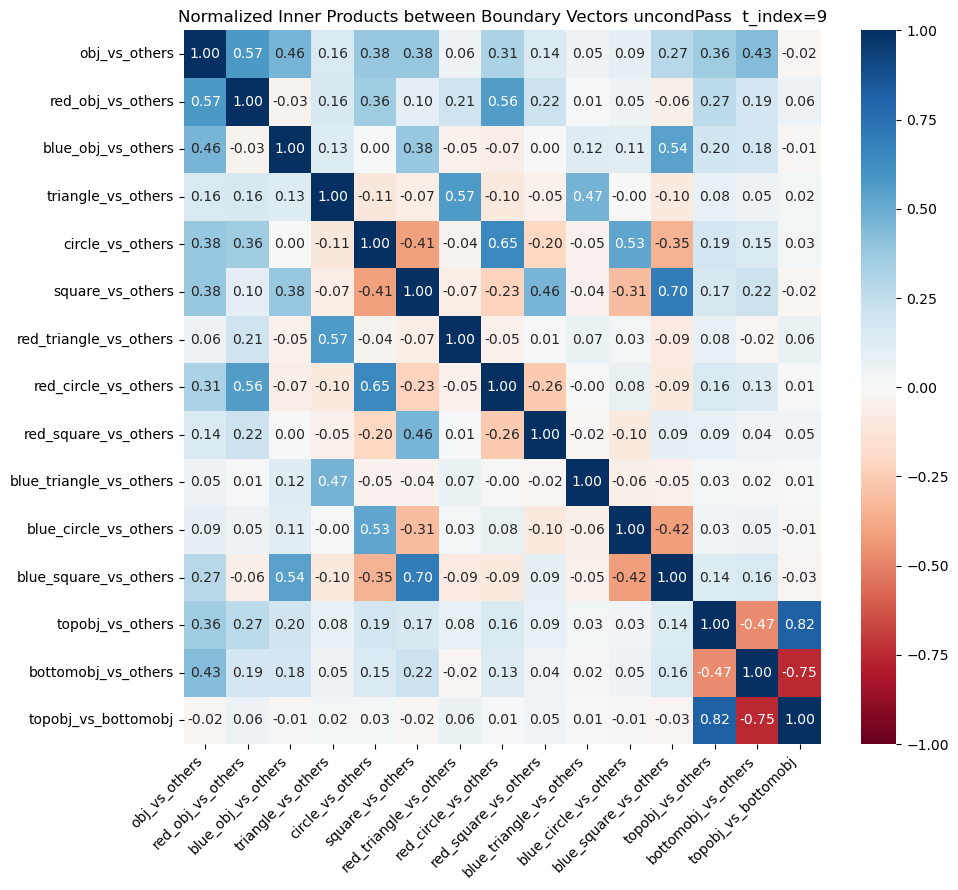

In [72]:
# Compute inner products between boundary vectors for each t_index
# Filter data for current t_index and cond-uncondPass
t_index = 9
# Define desired order of annotation labels
ordered_feature_names = [
    "obj_vs_others",
    "red_obj_vs_others",
    "blue_obj_vs_others",
    "triangle_vs_others", 
    "circle_vs_others",
    "square_vs_others", 
    "red_triangle_vs_others", 
    "red_circle_vs_others",
    "red_square_vs_others",
    "blue_triangle_vs_others",
    "blue_circle_vs_others", 
    "blue_square_vs_others",
    "topobj_vs_others", 
    "bottomobj_vs_others",
    "topobj_vs_bottomobj"
]
# Filter and sort data according to specified order
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'uncondPass'")
df_subsel = df_subsel.set_index('annot_label').loc[ordered_feature_names].reset_index()

# Extract boundary vectors and labels
vectors = np.stack(df_subsel['boundary_vector'].values)
labels = df_subsel['annot_label'].values

# Compute normalized inner products
norm_vectors = vectors / np.linalg.norm(vectors, axis=1)[:, None]
inner_products = norm_vectors @ norm_vectors.T

# Create heatmap
plt.figure(figsize=(10, 9.))
sns.heatmap(inner_products, 
            xticklabels=labels, 
            yticklabels=labels,
            annot=True, 
            fmt='.2f',
            cmap='RdBu',
            vmin=-1, 
            vmax=1,
            center=0)
plt.title(f'Normalized Inner Products between Boundary Vectors uncondPass  t_index={t_index}')
# turn the xticks rotation to 45 degrees
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

### Test cosine vector arithmetics

In [21]:
ordered_feature_names = [
    "obj_vs_others",
    "red_obj_vs_others",
    "blue_obj_vs_others",
    "triangle_vs_others", 
    "circle_vs_others",
    "square_vs_others", 
    "red_triangle_vs_others", 
    "red_circle_vs_others",
    "red_square_vs_others",
    "blue_triangle_vs_others",
    "blue_circle_vs_others", 
    "blue_square_vs_others",
    "topobj_vs_others", 
    "bottomobj_vs_others",
    "topobj_vs_bottomobj"
]

In [31]:
import numpy as np

def projection_expl_norm_ratio(A, vectors):
    """
    Computes how much of A's norm can be explained by the best linear
    combination (in a least-squares sense) of B and C.
    
    Returns the ratio:
        || projection_of_A_onto_span(vectors) ||^2 / || A ||^2
    """
    # Stack vectors side-by-side as columns to form the matrix M.
    # Each vector should be of the same dimension as A.
    M = np.column_stack(vectors)  # shape: (dim, len(vectors))
    # Solve for alpha, beta using least squares:
    # alpha, beta = argmin_{x} ||A - M x||^2.
    # In numpy, we can use np.linalg.lstsq to get the best x.
    x, residuals, rank, s = np.linalg.lstsq(M, A, rcond=None)
    # The projection of A onto span(vectors) is M @ x
    A_proj = M @ x
    # Compute the norm of A_proj and A
    A_norm = np.linalg.norm(A)
    A_proj_norm = np.linalg.norm(A_proj)
    # Return the ratio of the norms
    return A_proj_norm **2 / A_norm **2, x

In [46]:
t_index = 3
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'condPass'")
df_subsel = df_subsel.set_index('annot_label')

objvec = df_subsel.loc["obj_vs_others"].boundary_vector
redobjvec = df_subsel.loc["red_obj_vs_others"].boundary_vector 
trianglevec = df_subsel.loc["triangle_vs_others"].boundary_vector
redtrianglevec = df_subsel.loc["red_triangle_vs_others"].boundary_vector

projection_expl_norm_ratio(redtrianglevec, [objvec, redobjvec, trianglevec])

(0.5113158595095921, array([-0.18114984,  0.40543561,  0.56872022]))

In [29]:

objvec = df_subsel.loc["obj_vs_others"].boundary_vector
redobjvec = df_subsel.loc["red_obj_vs_others"].boundary_vector 
blueobjvec = df_subsel.loc["blue_obj_vs_others"].boundary_vector

projection_expl_norm_ratio(blueobjvec, [objvec, redobjvec])

(0.4044847990449015, array([ 0.72412562, -0.46267307]))

In [48]:
objvec = df_subsel.loc["obj_vs_others"].boundary_vector
triangleobjvec = df_subsel.loc["triangle_vs_others"].boundary_vector 
circleobjvec = df_subsel.loc["circle_vs_others"].boundary_vector
squareobjvec = df_subsel.loc["square_vs_others"].boundary_vector

projection_expl_norm_ratio(triangleobjvec, [objvec, circleobjvec, squareobjvec, ])

(0.1269818378930262, array([ 0.49692929, -0.00951902, -0.21320246]))

In [28]:
t_index = 13
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'uncondPass'")
df_subsel = df_subsel.set_index('annot_label')

objvec = df_subsel.loc["obj_vs_others"].boundary_vector
topobjvec = df_subsel.loc["topobj_vs_others"].boundary_vector 
bottomobjvec = df_subsel.loc["bottomobj_vs_others"].boundary_vector
topobj_bottomobjvec = df_subsel.loc["topobj_vs_bottomobj"].boundary_vector

print(projection_expl_norm_ratio(topobjvec, [objvec, topobj_bottomobjvec]))
print(projection_expl_norm_ratio(bottomobjvec, [objvec, topobj_bottomobjvec]))


(0.7843082997015951, array([0.43988958, 0.78416894]))
(0.7800784867830737, array([ 0.42688874, -0.75842601]))


In [78]:
def print_vector_arithmetic_test(df_subsel, annot_labels_rhs: str, annot_labels_lhs: list[str]):
    # df_subsel = df_subsel.set_index('annot_label')
    rhs_vec = df_subsel.loc[annot_labels_rhs].boundary_vector
    lhs_vecs = [df_subsel.loc[annot_label_lhs].boundary_vector for annot_label_lhs in annot_labels_lhs] 
    norm2ratio, lincoef = projection_expl_norm_ratio(rhs_vec, lhs_vecs) 
    print(rf"Vec[{annot_labels_rhs}] ≈ ", end="") # \approx
    for i, annot_label_lhs in enumerate(annot_labels_lhs):
        if i == 0:
            print(rf"{lincoef[i]:.2f} Vec[{annot_label_lhs}]", end=" ")
        else:
            if lincoef[i] > 0:
                print(rf"+ {lincoef[i]:.2f} Vec[{annot_label_lhs}]", end=" ")
            else:
                print(rf"- {-lincoef[i]:.2f} Vec[{annot_label_lhs}]", end=" ")
    print(f"\nlincoef: {lincoef}")
    print(f"[squared norm ratio: {norm2ratio:.2f}]")


#### Object Position vector arithmetics

In [87]:
# print_vector_arithmetic_test(df_subsel, "topobj_vs_bottomobj", ["obj_vs_others", "topobj_vs_others", "bottomobj_vs_others"],)
print_vector_arithmetic_test(df_subsel, "topobj_vs_others", ["obj_vs_others", "topobj_vs_bottomobj", "bottomobj_vs_others"],) # 
print_vector_arithmetic_test(df_subsel, "topobj_vs_others", ["obj_vs_others", "topobj_vs_bottomobj", ],) # "bottomobj_vs_others"

Vec[topobj_vs_others] ≈ 0.32 Vec[obj_vs_others] + 1.00 Vec[topobj_vs_bottomobj] + 0.28 Vec[bottomobj_vs_others] 
lincoef: [0.32054167 0.99620677 0.27957615]
[squared norm ratio: 0.80]
Vec[topobj_vs_others] ≈ 0.44 Vec[obj_vs_others] + 0.78 Vec[topobj_vs_bottomobj] 
lincoef: [0.43988958 0.78416894]
[squared norm ratio: 0.78]


#### Object attribute vector arithmetics

In [81]:
t_index = 13
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'uncondPass'")
df_subsel = df_subsel.set_index('annot_label')
print_vector_arithmetic_test(df_subsel, "red_triangle_vs_others", ["obj_vs_others", "triangle_vs_others", "circle_vs_others", "square_vs_others", 
                                                                   "red_obj_vs_others", "blue_obj_vs_others"],) # "bottomobj_vs_others"
print_vector_arithmetic_test(df_subsel, "red_triangle_vs_others", ["obj_vs_others", "triangle_vs_others", "red_obj_vs_others",],) 
print_vector_arithmetic_test(df_subsel, "red_triangle_vs_others", ["triangle_vs_others", "red_obj_vs_others",],) 
# print_vector_arithmetic_test(df_subsel, "red_triangle_vs_others", ["triangle_vs_others", "red_obj_vs_others", ],) # "bottomobj_vs_others"

Vec[red_triangle_vs_others] ≈ -0.09 Vec[obj_vs_others] + 0.58 Vec[triangle_vs_others] - 0.04 Vec[circle_vs_others] + 0.02 Vec[square_vs_others] + 0.21 Vec[red_obj_vs_others] - 0.03 Vec[blue_obj_vs_others] 
lincoef: [-0.09068386  0.57572716 -0.04163538  0.01966897  0.21074373 -0.02942327]
[squared norm ratio: 0.38]
Vec[red_triangle_vs_others] ≈ -0.12 Vec[obj_vs_others] + 0.58 Vec[triangle_vs_others] + 0.22 Vec[red_obj_vs_others] 
lincoef: [-0.11818606  0.57929273  0.21749317]
[squared norm ratio: 0.38]
Vec[red_triangle_vs_others] ≈ 0.57 Vec[triangle_vs_others] + 0.16 Vec[red_obj_vs_others] 
lincoef: [0.56664315 0.16014658]
[squared norm ratio: 0.37]


In [82]:
t_index = 13
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'uncondPass'")
df_subsel = df_subsel.set_index('annot_label')
print_vector_arithmetic_test(df_subsel, "red_square_vs_others", ["obj_vs_others", "triangle_vs_others", "circle_vs_others", "square_vs_others", 
                                                                   "red_obj_vs_others", "blue_obj_vs_others"],) # "bottomobj_vs_others"
print_vector_arithmetic_test(df_subsel, "red_square_vs_others", ["obj_vs_others", "square_vs_others", 
                                                                   "red_obj_vs_others",],) 
print_vector_arithmetic_test(df_subsel, "red_square_vs_others", ["square_vs_others", "red_obj_vs_others",],) 
# print_vector_arithmetic_test(df_subsel, "red_triangle_vs_others", ["triangle_vs_others", "red_obj_vs_others", ],) # "bottomobj_vs_others"

Vec[red_square_vs_others] ≈ -0.05 Vec[obj_vs_others] - 0.04 Vec[triangle_vs_others] - 0.07 Vec[circle_vs_others] + 0.35 Vec[square_vs_others] + 0.42 Vec[red_obj_vs_others] - 0.06 Vec[blue_obj_vs_others] 
lincoef: [-0.04850144 -0.03599242 -0.07302879  0.35114623  0.42398974 -0.0615667 ]
[squared norm ratio: 0.33]
Vec[red_square_vs_others] ≈ -0.14 Vec[obj_vs_others] + 0.39 Vec[square_vs_others] + 0.44 Vec[red_obj_vs_others] 
lincoef: [-0.14187818  0.3928517   0.44131172]
[squared norm ratio: 0.32]
Vec[red_square_vs_others] ≈ 0.34 Vec[square_vs_others] + 0.38 Vec[red_obj_vs_others] 
lincoef: [0.34387181 0.37984247]
[squared norm ratio: 0.31]


In [83]:
t_index = 13
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'uncondPass'")
df_subsel = df_subsel.set_index('annot_label')
print_vector_arithmetic_test(df_subsel, "blue_square_vs_others", ["obj_vs_others", "triangle_vs_others", "circle_vs_others", "square_vs_others", 
                                                                   "red_obj_vs_others", "blue_obj_vs_others"],) # "bottomobj_vs_others"
print_vector_arithmetic_test(df_subsel, "blue_square_vs_others", ["obj_vs_others", "square_vs_others", 
                                                                   "blue_obj_vs_others",],) 
print_vector_arithmetic_test(df_subsel, "blue_square_vs_others", ["square_vs_others", "blue_obj_vs_others",],) 
# print_vector_arithmetic_test(df_subsel, "red_triangle_vs_others", ["triangle_vs_others", "red_obj_vs_others", ],) # "bottomobj_vs_others"

Vec[blue_square_vs_others] ≈ -0.11 Vec[obj_vs_others] - 0.12 Vec[triangle_vs_others] - 0.13 Vec[circle_vs_others] + 0.59 Vec[square_vs_others] - 0.04 Vec[red_obj_vs_others] + 0.36 Vec[blue_obj_vs_others] 
lincoef: [-0.10722253 -0.11620534 -0.13354541  0.58927064 -0.04077537  0.36223406]
[squared norm ratio: 0.64]
Vec[blue_square_vs_others] ≈ -0.26 Vec[obj_vs_others] + 0.69 Vec[square_vs_others] + 0.39 Vec[blue_obj_vs_others] 
lincoef: [-0.25780611  0.69061539  0.38605467]
[squared norm ratio: 0.62]
Vec[blue_square_vs_others] ≈ 0.62 Vec[square_vs_others] + 0.28 Vec[blue_obj_vs_others] 
lincoef: [0.61530396 0.28462205]
[squared norm ratio: 0.58]


#### What is the generic object vector? is it the average of others?

In [86]:
t_index = 13
df_subsel = syn_df.query("t_index == @t_index and training_pass == 'uncondPass'")
df_subsel = df_subsel.set_index('annot_label')
print_vector_arithmetic_test(df_subsel, "obj_vs_others", ["triangle_vs_others", "circle_vs_others", "square_vs_others", 
                                                          "red_obj_vs_others", "blue_obj_vs_others", 
                                                          "red_triangle_vs_others", "red_circle_vs_others", "red_square_vs_others", "blue_triangle_vs_others", "blue_circle_vs_others", "blue_square_vs_others"],) # "bottomobj_vs_others"
print_vector_arithmetic_test(df_subsel, "obj_vs_others", ["triangle_vs_others", "circle_vs_others", "square_vs_others", 
                                                          "red_obj_vs_others", "blue_obj_vs_others", ],) # "bottomobj_vs_others"
print_vector_arithmetic_test(df_subsel, "obj_vs_others", ["triangle_vs_others", "circle_vs_others", "square_vs_others", ],) 
print_vector_arithmetic_test(df_subsel, "obj_vs_others", ["red_obj_vs_others", "blue_obj_vs_others", ],) 
#                                                                    "blue_obj_vs_others",],) 
# print_vector_arithmetic_test(df_subsel, "blue_square_vs_others", ["square_vs_others", "blue_obj_vs_others",],) 
# print_vector_arithmetic_test(df_subsel, "red_triangle_vs_others", ["triangle_vs_others", "red_obj_vs_others", ],) # "bottomobj_vs_others"

Vec[obj_vs_others] ≈ 0.23 Vec[triangle_vs_others] + 0.57 Vec[circle_vs_others] + 0.47 Vec[square_vs_others] + 0.34 Vec[red_obj_vs_others] + 0.43 Vec[blue_obj_vs_others] - 0.07 Vec[red_triangle_vs_others] - 0.14 Vec[red_circle_vs_others] - 0.07 Vec[red_square_vs_others] - 0.11 Vec[blue_triangle_vs_others] - 0.20 Vec[blue_circle_vs_others] - 0.16 Vec[blue_square_vs_others] 
lincoef: [ 0.23449285  0.57193975  0.46593699  0.33671802  0.4291348  -0.06892745
 -0.13537989 -0.07349122 -0.10539375 -0.20036605 -0.15554133]
[squared norm ratio: 0.74]
Vec[obj_vs_others] ≈ 0.19 Vec[triangle_vs_others] + 0.45 Vec[circle_vs_others] + 0.42 Vec[square_vs_others] + 0.28 Vec[red_obj_vs_others] + 0.33 Vec[blue_obj_vs_others] 
lincoef: [0.19194964 0.45461368 0.42067373 0.28449328 0.32843945]
[squared norm ratio: 0.71]
Vec[obj_vs_others] ≈ 0.30 Vec[triangle_vs_others] + 0.65 Vec[circle_vs_others] + 0.66 Vec[square_vs_others] 
lincoef: [0.30026049 0.65416827 0.6594618 ]
[squared norm ratio: 0.61]
Vec[obj_vs_

## Geometry of classify boundary vectors via PCA, tSNE, UMAP

In [21]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

# plot the PCA / t-SNE / UMAP of the boundary vectors and then color by the training pass
boundary_vectors_all = np.stack(syn_df['boundary_vector'].values)
pca = PCA(n_components=5)
dimred_embeds = pca.fit_transform(boundary_vectors_all)
print(pca.explained_variance_ratio_)

[0.12311363 0.10933688 0.08175997 0.05367108 0.04881782]


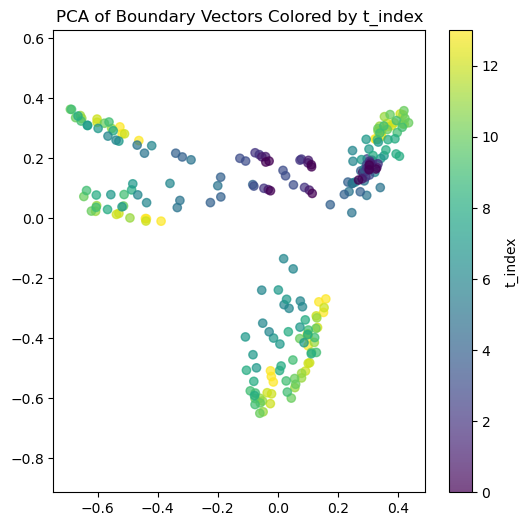

/tmp/ipykernel_2303463/2722878762.py:17: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])


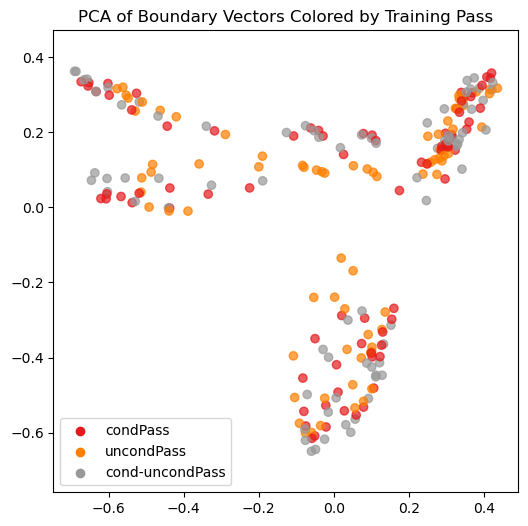

/tmp/ipykernel_2303463/2722878762.py:28: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])


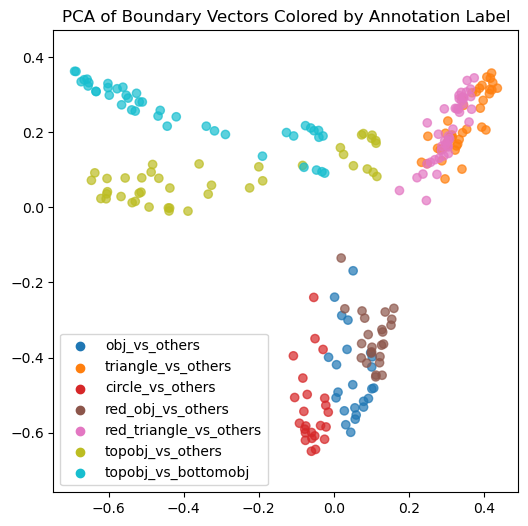

In [22]:
def plot_pca_results(dimred_embeds, df):
    # Plot by t_index
    plt.figure(figsize=(6, 6))
    plt.scatter(dimred_embeds[:, 0], dimred_embeds[:, 1], c=df['t_index'].values, alpha=0.7, cmap='viridis')
    plt.axis('equal')
    plt.colorbar(label='t_index')
    plt.title('PCA of Boundary Vectors Colored by t_index')
    plt.show()

    # Plot by training pass
    unique_labels = df['training_pass'].unique()
    color_map = dict(zip(unique_labels, plt.cm.Set1(np.linspace(0, 1, len(unique_labels)))))
    colors = [color_map[label] for label in df['training_pass'].values]
    plt.figure(figsize=(6, 6))
    plt.scatter(dimred_embeds[:, 0], dimred_embeds[:, 1], c=colors, alpha=0.7)
    plt.axis('equal')
    plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])
    plt.title('PCA of Boundary Vectors Colored by Training Pass')
    plt.show()

    # Plot by annotation label
    unique_labels = df['annot_label'].unique()
    color_map = dict(zip(unique_labels, plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))))
    colors = [color_map[label] for label in df['annot_label'].values]
    plt.figure(figsize=(6, 6))
    plt.scatter(dimred_embeds[:, 0], dimred_embeds[:, 1], c=colors, alpha=0.7)
    plt.axis('equal')
    plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])
    plt.title('PCA of Boundary Vectors Colored by Annotation Label')
    plt.show()

plot_pca_results(dimred_embeds, syn_df)

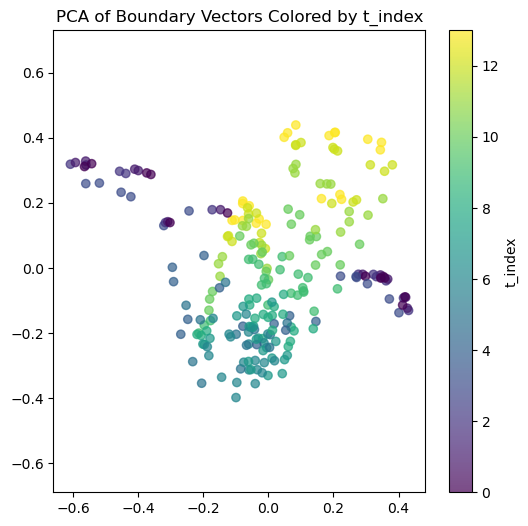

/tmp/ipykernel_2303463/2722878762.py:17: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])


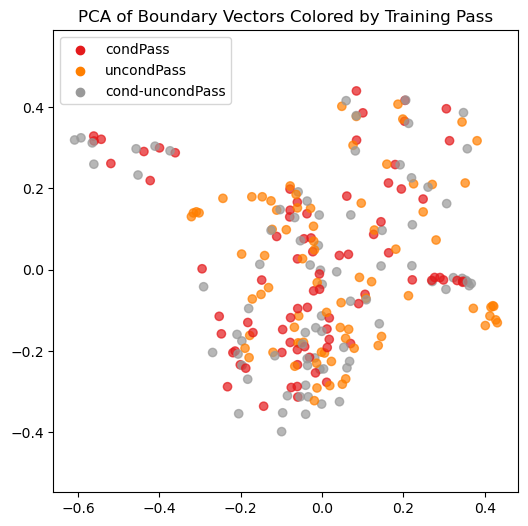

/tmp/ipykernel_2303463/2722878762.py:28: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])


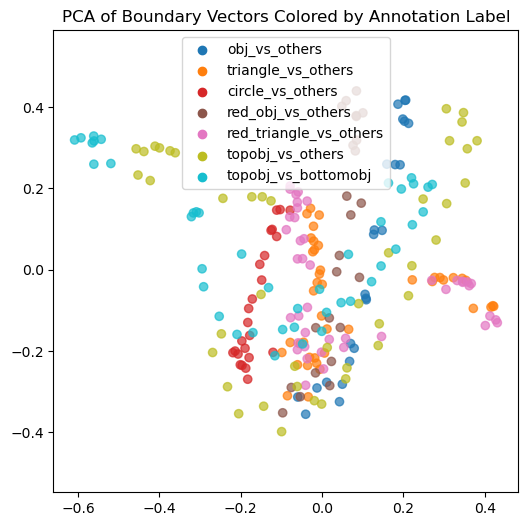

In [23]:
plot_pca_results(dimred_embeds[:, 3:5], syn_df)

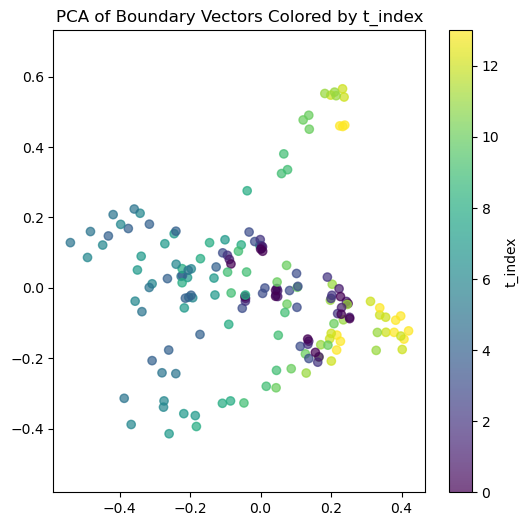

/tmp/ipykernel_2156354/2722878762.py:17: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])


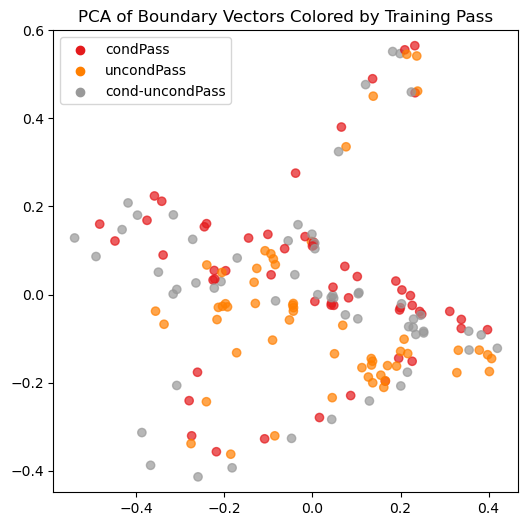

/tmp/ipykernel_2156354/2722878762.py:28: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])


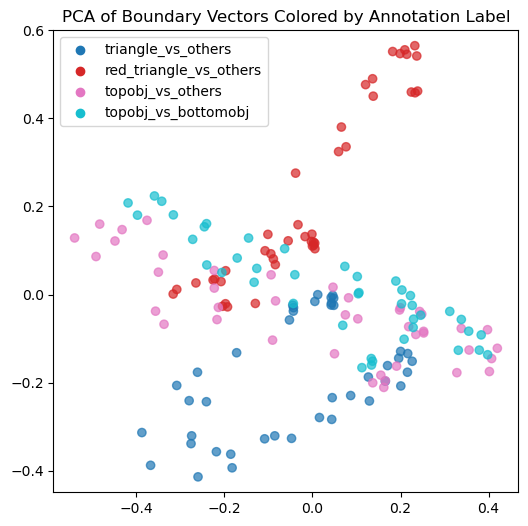

In [44]:
plot_pca_results(dimred_embeds[:, 3:5], syn_df)


### Dev zone

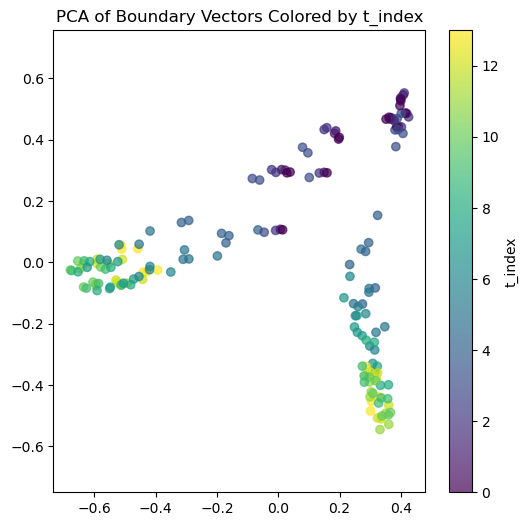

/tmp/ipykernel_2156354/3959842361.py:14: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])


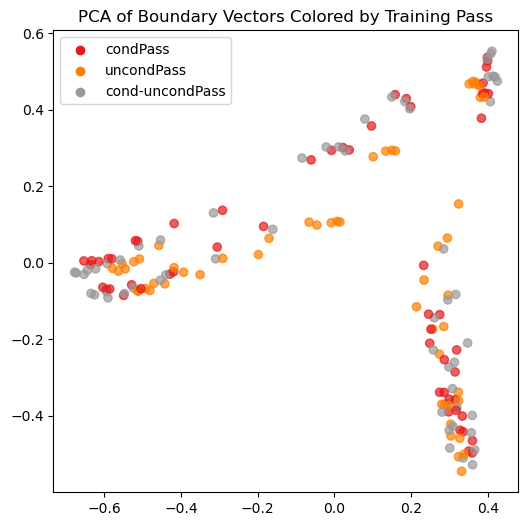

/tmp/ipykernel_2156354/3959842361.py:27: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])


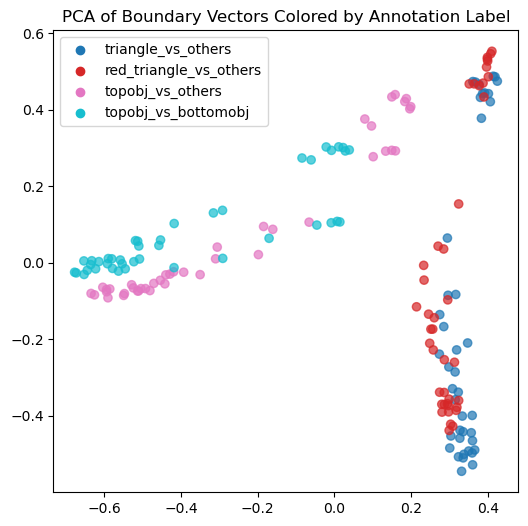

In [ ]:
plt.figure(figsize=(6, 6))
plt.scatter(dimred_embeds[:, 0], dimred_embeds[:, 1], c=syn_df['t_index'].values, alpha=0.7, cmap='viridis')
plt.axis('equal')
plt.colorbar(label='t_index')
plt.title('PCA of Boundary Vectors Colored by t_index')
plt.show()

unique_labels = syn_df['training_pass'].unique()
color_map = dict(zip(unique_labels, plt.cm.Set1(np.linspace(0, 1, len(unique_labels)))))
colors = [color_map[label] for label in syn_df['training_pass'].values]
plt.figure(figsize=(6, 6))
plt.scatter(dimred_embeds[:, 0], dimred_embeds[:, 1], c=colors, alpha=0.7)
plt.axis('equal')
plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])
plt.title('PCA of Boundary Vectors Colored by Training Pass')
plt.show()

# Create categorical color mapping for discrete labels
unique_labels = syn_df['annot_label'].unique()
color_map = dict(zip(unique_labels, plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))))
colors = [color_map[label] for label in syn_df['annot_label'].values]

plt.figure(figsize=(6, 6))
scatter = plt.scatter(dimred_embeds[:, 0], dimred_embeds[:, 1], c=colors, alpha=0.7)
plt.axis('equal')
plt.legend(handles=[plt.scatter([], [], c=color_map[label], label=label) for label in unique_labels])
plt.title('PCA of Boundary Vectors Colored by Annotation Label')
plt.show()